***LOADING LIBRARIES***

In [ ]:
pip install cellrank --quiet

Note: you may need to restart the kernel to use updated packages.


In [ ]:
!pip install scvelo --upgrade --quiet

In [ ]:
pip install python-igraph

Note: you may need to restart the kernel to use updated packages.


In [ ]:
pip install jgraph --upgrade --quiet

Note: you may need to restart the kernel to use updated packages.


In [ ]:
pip install louvain

Note: you may need to restart the kernel to use updated packages.


# IMPORTING LIBRARIES

In [ ]:
import cellrank as cr

In [ ]:
import scvelo as scv
import pandas as pd
#import velocyto as vcy
import time
import scipy
import pickle
import numpy as np
import pandas as pd
import scanpy as scp
import matplotlib
import seaborn as sns
import matplotlib.pyplot as plt
import matplotlib_venn as ven
from matplotlib.gridspec import GridSpec

import sklearn
from sklearn.decomposition import PCA
from sklearn.metrics import r2_score, mean_absolute_error, mean_squared_error, accuracy_score, cohen_kappa_score, confusion_matrix, recall_score, classification_report, precision_score
from scipy.stats import spearmanr, zscore
from sklearn.model_selection import train_test_split, GridSearchCV
from sklearn.linear_model import Lasso, Ridge, ElasticNet
import scvelo as scv
scv.logging.print_version()
import jgraph as ig
from sklearn.svm import SVC
import os

Running scvelo 0.2.4 (python 3.8.5) on 2021-10-05 11:21.


In [ ]:
scv.logging.print_version()
scv.settings.verbosity = 3  # show errors(0), warnings(1), info(2), hints(3)
scv.settings.presenter_view = True  # set max width size for presenter view
scv.set_figure_params('scvelo')  # for beautified visualization
scv.set_figure_params()

Running scvelo 0.2.4 (python 3.8.5) on 2021-10-05 11:21.


In [ ]:
file = "olfactory_deprived.loom"
adata = scv.read_loom(file)
adata

Variable names are not unique. To make them unique, call `.var_names_make_unique`.


AnnData object with n_obs × n_vars = 4480 × 32285
    obs: 'Clusters', '_X', '_Y'
    var: 'Accession', 'Chromosome', 'End', 'Start', 'Strand'
    layers: 'matrix', 'ambiguous', 'spliced', 'unspliced'

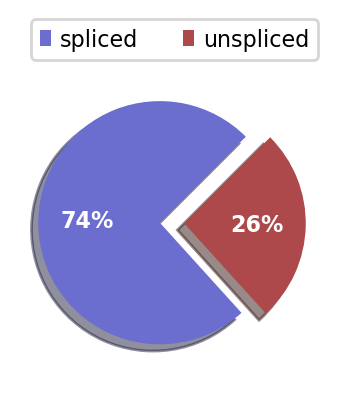

In [ ]:
adata.var_names_make_unique()
scv.pl.proportions(adata)

In [ ]:
f = adata

In [ ]:
# filter cells and genes
scp.pp.filter_cells(f, min_genes=200)
scp.pp.filter_genes(f, min_cells=3)

In [ ]:
f.var['mt'] = f.var_names.str.startswith('MT-')  # annotate the group of mitochondrial genes as 'mt'
scp.pp.calculate_qc_metrics(f, qc_vars=['mt'], percent_top=None, log1p=False, inplace=True)

... storing 'Chromosome' as categorical
... storing 'Strand' as categorical


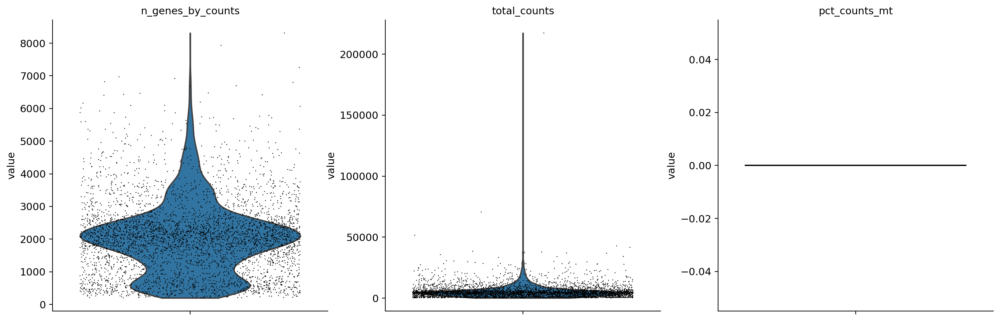

In [ ]:
scp.pl.violin(f, ['n_genes_by_counts', 'total_counts', 'pct_counts_mt'],
             jitter=0.4, multi_panel=True, save = 'cell_counts.pdf')

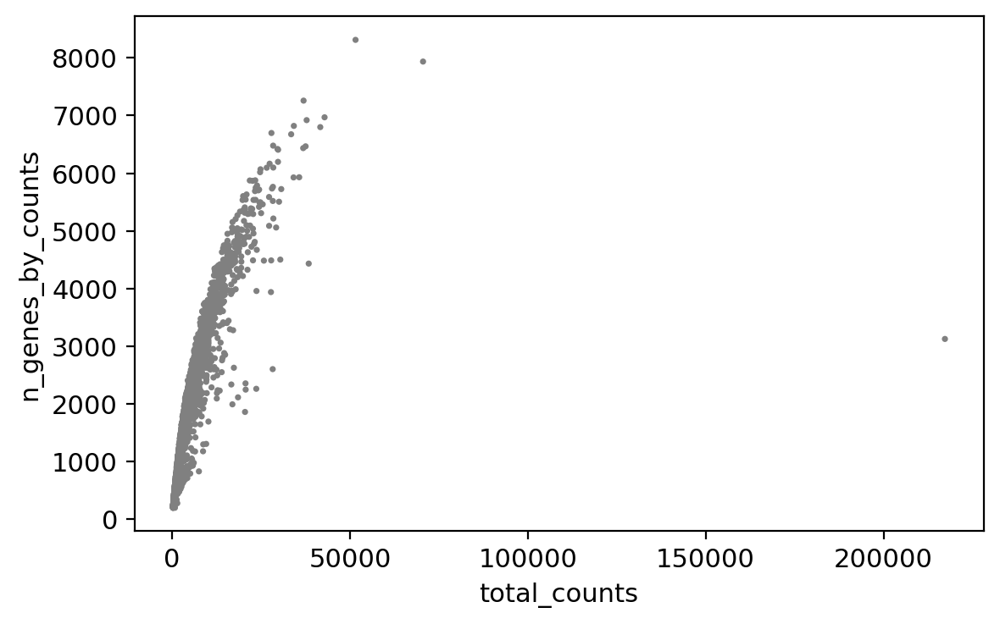

In [ ]:
scp.pl.scatter(f, x='total_counts', y='n_genes_by_counts')

In [ ]:
f = f[f.obs.n_genes_by_counts < 2500, :]
f = f[f.obs.pct_counts_mt < 5, :]
f

View of AnnData object with n_obs × n_vars = 3292 × 18448
    obs: 'Clusters', '_X', '_Y', 'n_genes', 'n_genes_by_counts', 'total_counts', 'total_counts_mt', 'pct_counts_mt'
    var: 'Accession', 'Chromosome', 'End', 'Start', 'Strand', 'n_cells', 'mt', 'n_cells_by_counts', 'mean_counts', 'pct_dropout_by_counts', 'total_counts'
    layers: 'matrix', 'ambiguous', 'spliced', 'unspliced'

In [ ]:
print(f.obs.index)
f.obs['CellID'] = f.obs.index
print(f.obs)
print(f.var.index)
f.var['Gene'] = f.var.index
print(f.var)

Trying to set attribute `.obs` of view, copying.


Index(['SRR12545952:AACAAAGCATCATCCCx', 'SRR12545952:AAACGAAAGGACTTCTx',
       'SRR12545952:AAAGTCCCACCCTAAAx', 'SRR12545952:AAAGTCCTCTTGGATGx',
       'SRR12545952:AACCATGGTATAGGGCx', 'SRR12545952:AACCACACAGCTTTGAx',
       'SRR12545952:AACAGGGTCTGAATGCx', 'SRR12545952:AAAGAACTCGAGAATAx',
       'SRR12545952:AACAACCCACTGGATTx', 'SRR12545952:AACACACCACACTTAGx',
       ...
       'SRR12545952:TTGTTGTAGTTTGCTGx', 'SRR12545952:TTTGACTTCGCTAATGx',
       'SRR12545952:TTTACTGTCCGAGATTx', 'SRR12545952:TTTAGTCCAGATCCATx',
       'SRR12545952:TTTGATCGTTTACTTCx', 'SRR12545952:TTTGGTTGTTCGGCCAx',
       'SRR12545952:TTGTTGTAGTGCTACTx', 'SRR12545952:TTTCATGGTACCCAGCx',
       'SRR12545952:TTGTTTGTCCAGTGCGx', 'SRR12545952:TTTACCAAGATAACGTx'],
      dtype='object', length=3292)
                               Clusters         _X         _Y  n_genes  \
SRR12545952:AACAAAGCATCATCCCx         1 -13.831106   6.407388     2481   
SRR12545952:AAACGAAAGGACTTCTx         1 -14.909212   8.972316      697   
S

# SAVING FILTERED FILE

In [ ]:
#file with all genes
cdata = f
cdata.write_loom("filtered_data_cluster.loom", write_obsm_varm=True)

In [ ]:
#basic preprocessing of data
scv.pp.filter_and_normalize(f, n_top_genes=2000)
scv.pp.neighbors(f)
scv.pp.moments(f, n_pcs=30, n_neighbors=30)

Normalized count data: X, spliced, unspliced.
Extracted 2000 highly variable genes.
Logarithmized X.
computing neighbors
    finished (0:00:02) --> added 
    'distances' and 'connectivities', weighted adjacency matrices (adata.obsp)
computing moments based on connectivities
    finished (0:00:00) --> added 
    'Ms' and 'Mu', moments of un/spliced abundances (adata.layers)


In [ ]:
scv.tl.velocity(f)
scv.tl.velocity_graph(f)

computing velocities
    finished (0:00:00) --> added 
    'velocity', velocity vectors for each individual cell (adata.layers)
computing velocity graph (using 1/20 cores)


/home/sanjay/anaconda3/lib/python3.8/site-packages/scvelo/core/_parallelize.py:138: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray
  res = np.array(res) if as_array else res


    finished (0:00:10) --> added 
    'velocity_graph', sparse matrix with cosine correlations (adata.uns)


In [ ]:
scv.tl.umap(f, n_components=2)
scv.tl.louvain(f)

# READ RAW DATA AND CHECK EXPRESSION

In [ ]:
ddata = scv.read_loom("filtered_data_cluster.loom", sparse=False)
ddata

AnnData object with n_obs × n_vars = 3292 × 18448
    obs: 'Clusters', '_X', '_Y', 'n_genes', 'n_genes_by_counts', 'pct_counts_mt', 'total_counts', 'total_counts_mt'
    var: 'Accession', 'Chromosome', 'End', 'Start', 'Strand', 'mean_counts', 'mt', 'n_cells', 'n_cells_by_counts', 'pct_dropout_by_counts', 'total_counts'
    layers: 'matrix', 'ambiguous', 'spliced', 'unspliced'

In [ ]:
c = f.obs['louvain']
ddata.obs['louvain'] = c

... storing 'Chromosome' as categorical
... storing 'Strand' as categorical


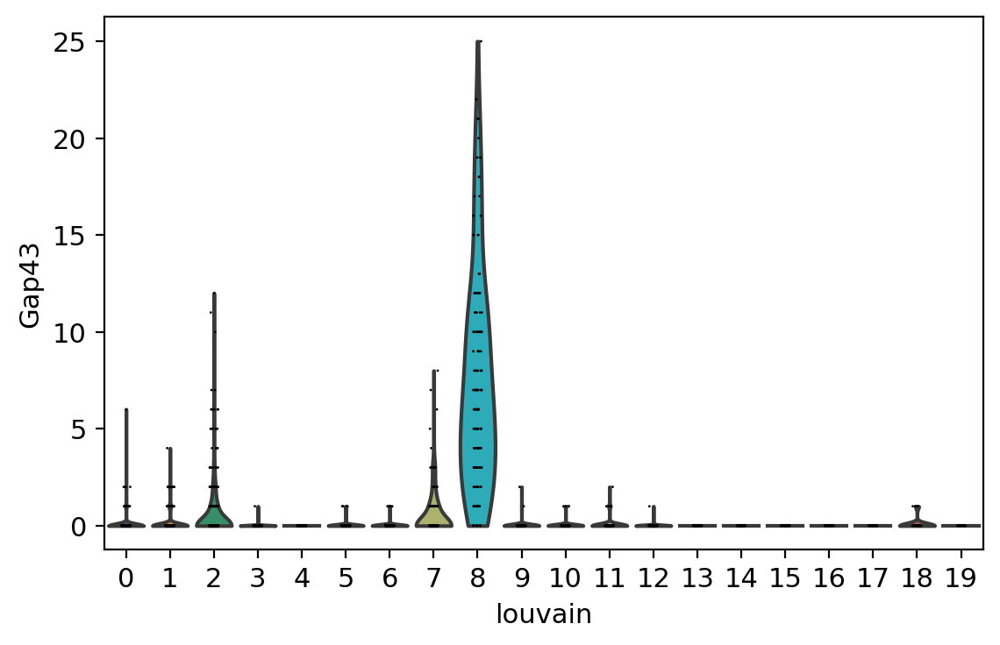

In [ ]:
#Expression of Immature neuron marker to assign clusters their stage
immature_neuron_markers = ["Gap43"]
scp.pl.violin(ddata, keys=immature_neuron_markers, groupby='louvain', save = 'immature_neurons_exp.pdf')

         Falling back to preprocessing with `sc.pp.pca` and default params.


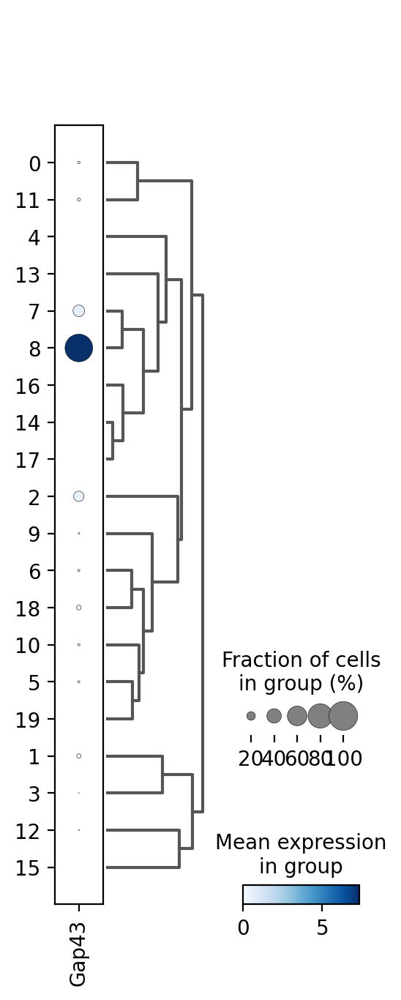

In [ ]:
scp.pl.dotplot(ddata, immature_neuron_markers,dendrogram=True, cmap='Blues', groupby='louvain', save = 'dotplot-immature-exp.pdf')

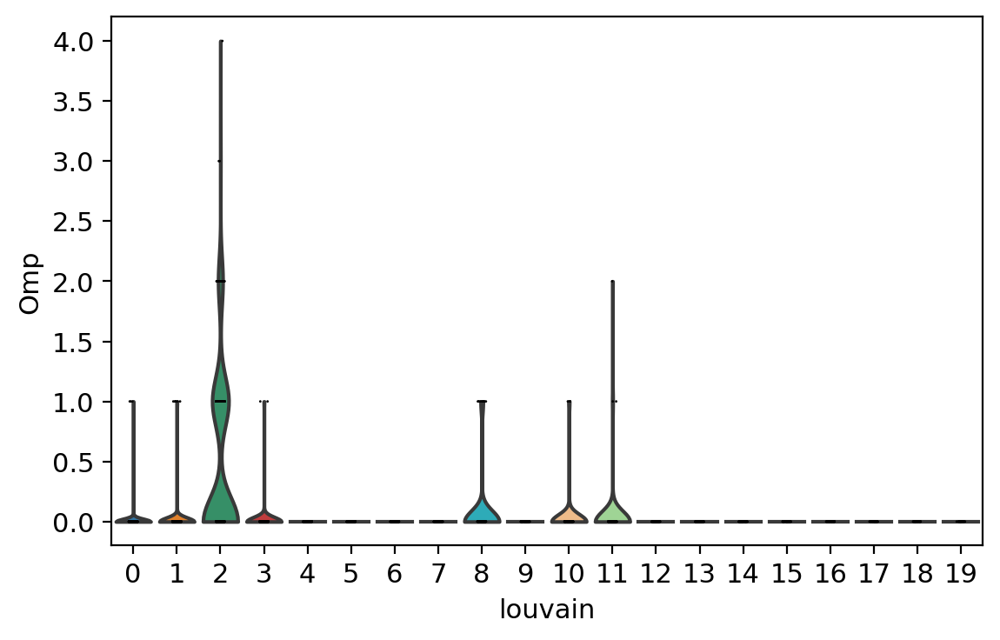

In [ ]:
#Mature neuron markers to name the clusters on basis of stage
mature_neuron_markers = ["Omp"]
scp.pl.violin(ddata, keys=mature_neuron_markers, groupby='louvain', save = 'mature-exp.pdf')

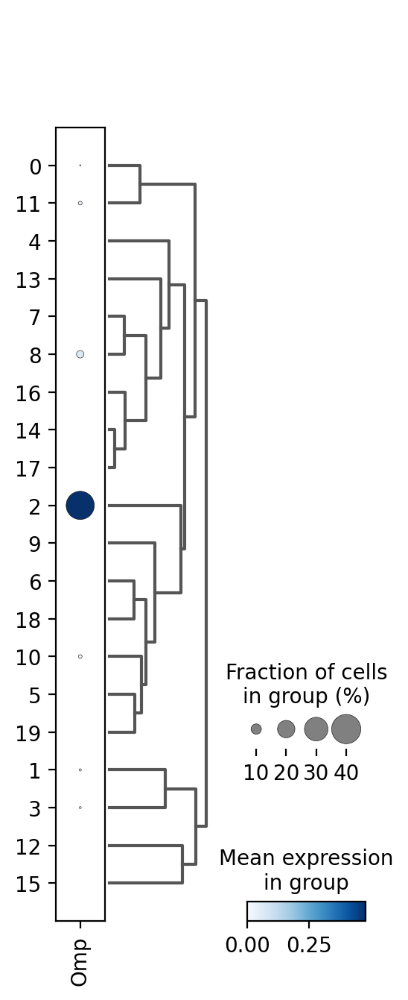

In [ ]:
scp.pl.dotplot(ddata, mature_neuron_markers,dendrogram=True, cmap='Blues', groupby='louvain', save = 'dotplot-mature-exp.pdf')

computing velocity embedding
    finished (0:00:00) --> added
    'velocity_umap', embedded velocity vectors (adata.obsm)
saving figure to file ./figures/scvelo_velocity-embedding.pdf


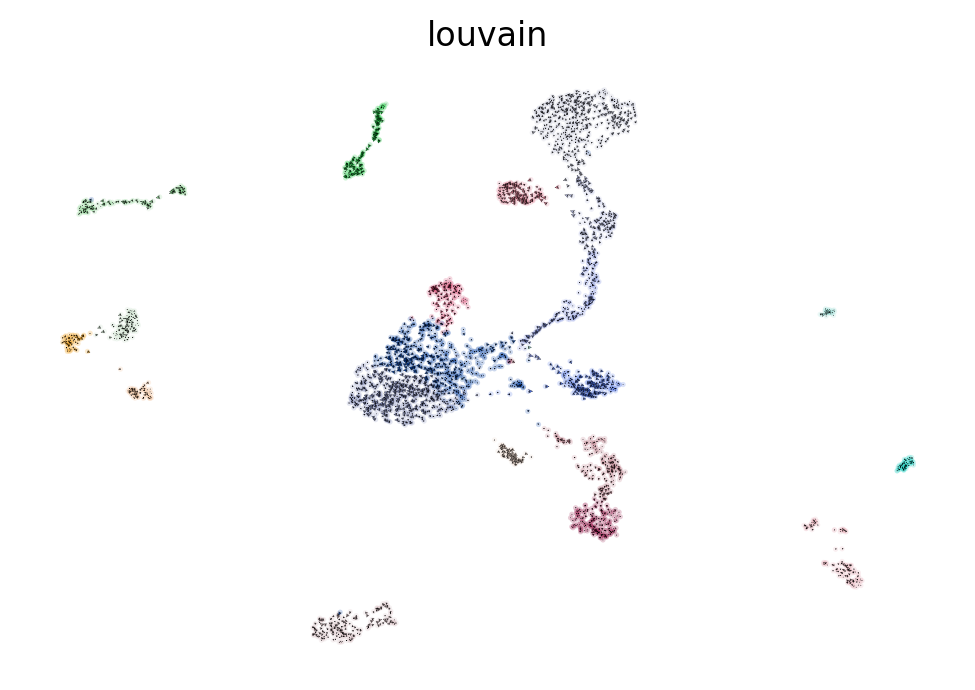

In [ ]:
scv.pl.velocity_embedding(f, basis = 'umap', color = 'louvain', save = 'velocity-embedding.pdf')

figure cannot be saved as pdf, using png instead.
saving figure to file ./figures/scvelo_velocity-embedding-stream-steady.png


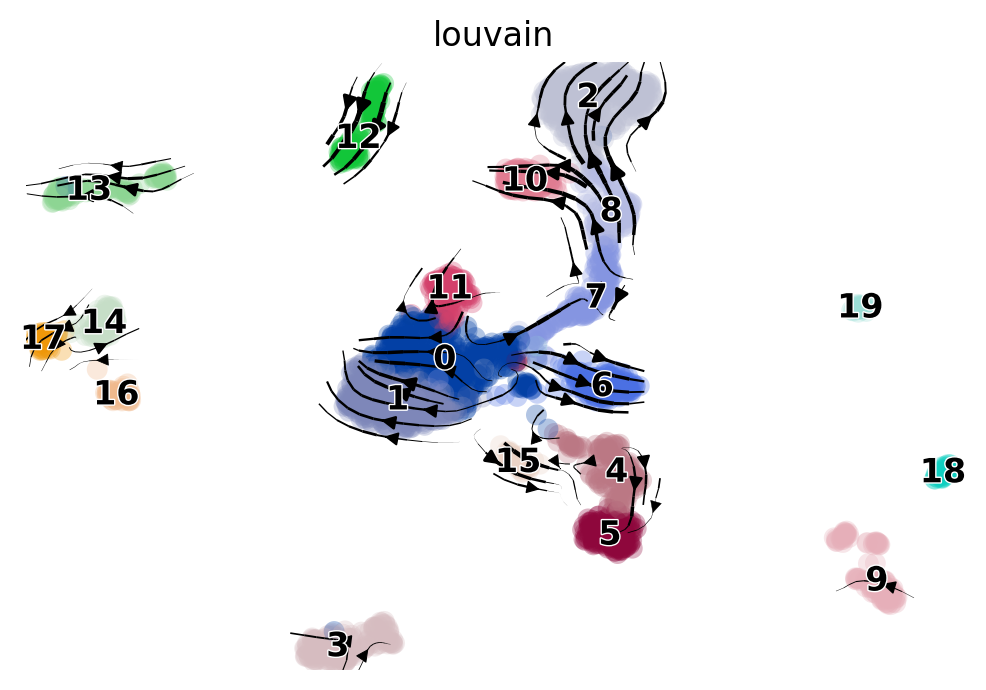

In [ ]:
scv.pl.velocity_embedding_stream(f, basis = 'umap', color = "louvain",save = 'velocity-embedding-stream-steady.pdf')

In [ ]:
mask = (f.obs["louvain"]  == "8") | (f.obs["louvain"]  == "2")
final = f[mask].copy()

In [ ]:
scv.pp.neighbors(final)
scv.pp.moments(final, n_pcs=30, n_neighbors=30)
scv.tl.velocity(final)
scv.tl.velocity_graph(final)
scv.tl.umap(final, n_components=2)
scv.tl.louvain(final)


computing neighbors
    finished (0:00:00) --> added 
    'distances' and 'connectivities', weighted adjacency matrices (adata.obsp)
computing moments based on connectivities
    finished (0:00:00) --> added 
    'Ms' and 'Mu', moments of un/spliced abundances (adata.layers)
computing velocities
    finished (0:00:00) --> added 
    'velocity', velocity vectors for each individual cell (adata.layers)
computing velocity graph (using 1/20 cores)


/home/sanjay/anaconda3/lib/python3.8/site-packages/scvelo/core/_parallelize.py:138: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray
  res = np.array(res) if as_array else res



    finished (0:00:01) --> added 
    'velocity_graph', sparse matrix with cosine correlations (adata.uns)


In [ ]:
f

AnnData object with n_obs × n_vars = 3292 × 2000
    obs: 'Clusters', '_X', '_Y', 'n_genes', 'n_genes_by_counts', 'total_counts', 'total_counts_mt', 'pct_counts_mt', 'CellID', 'initial_size_spliced', 'initial_size_unspliced', 'initial_size', 'n_counts', 'velocity_self_transition', 'louvain'
    var: 'Accession', 'Chromosome', 'End', 'Start', 'Strand', 'n_cells', 'mt', 'n_cells_by_counts', 'mean_counts', 'pct_dropout_by_counts', 'total_counts', 'Gene', 'gene_count_corr', 'means', 'dispersions', 'dispersions_norm', 'highly_variable', 'velocity_gamma', 'velocity_qreg_ratio', 'velocity_r2', 'velocity_genes'
    uns: 'pca', 'neighbors', 'velocity_params', 'velocity_graph', 'velocity_graph_neg', 'umap', 'louvain', 'louvain_colors'
    obsm: 'X_pca', 'X_umap', 'velocity_umap'
    varm: 'PCs'
    layers: 'matrix', 'ambiguous', 'spliced', 'unspliced', 'Ms', 'Mu', 'velocity', 'variance_velocity'
    obsp: 'distances', 'connectivities'

computing velocity embedding
    finished (0:00:00) --> added
    'velocity_umap', embedded velocity vectors (adata.obsm)
figure cannot be saved as pdf, using png instead.
saving figure to file ./figures/scvelo_velocity-embedding-stream-steady.png


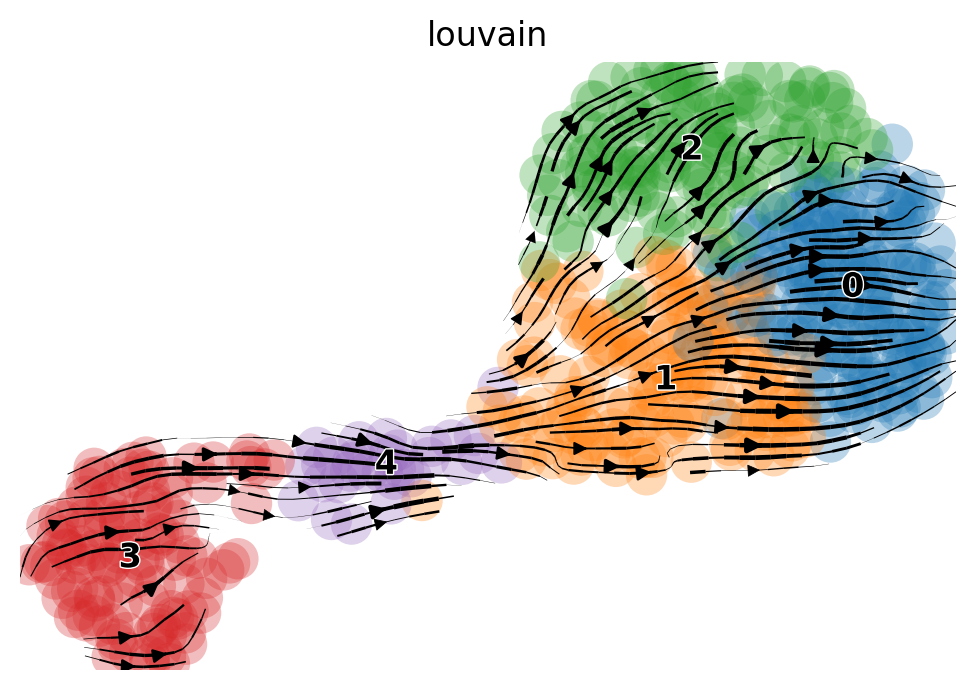

In [ ]:
scv.pl.velocity_embedding_stream(final, basis = 'umap', color = "louvain",save = 'velocity-embedding-stream-steady.pdf')

In [ ]:
cell = final.obs_names.tolist()

fdata = ddata[cell,:]

In [ ]:
c = final.obs['louvain']
fdata.obs['louvains'] = c

Trying to set attribute `.obs` of view, copying.


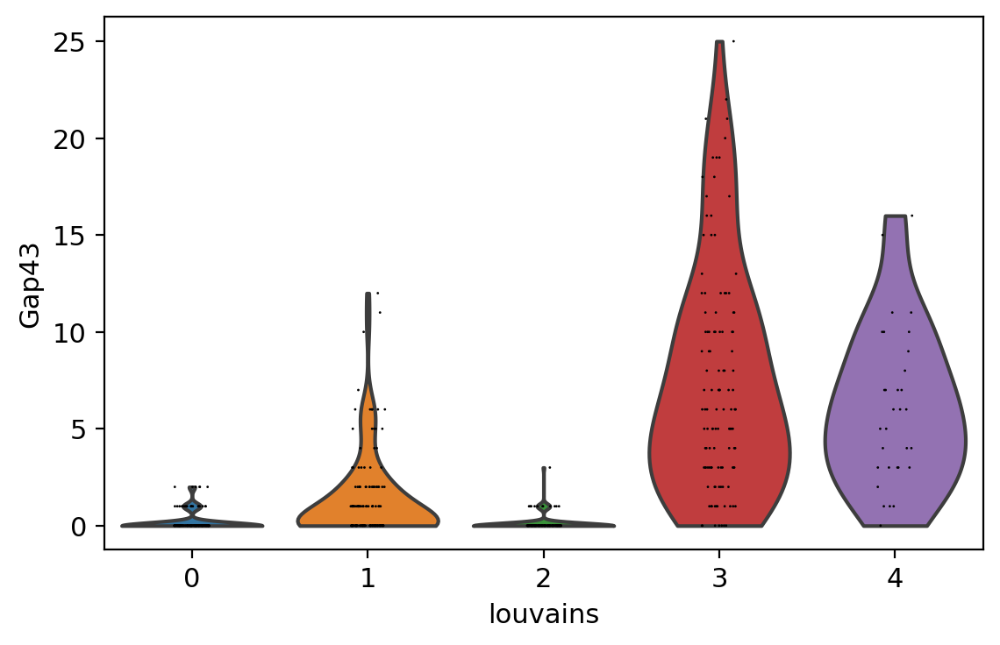

In [ ]:
#Expression of Immature neuron marker to assign clusters their stage
immature_neuron_markers = ["Gap43"]
scp.pl.violin(fdata, keys=immature_neuron_markers, groupby='louvains', save = 'immature_neurons2_exp.pdf')

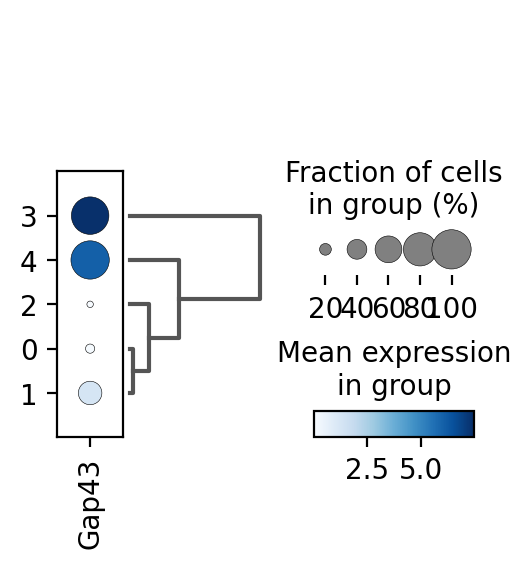

In [ ]:
scp.pl.dotplot(fdata, immature_neuron_markers,dendrogram=True, cmap='Blues', groupby='louvains', save = 'dotplot-immature2-exp.pdf')

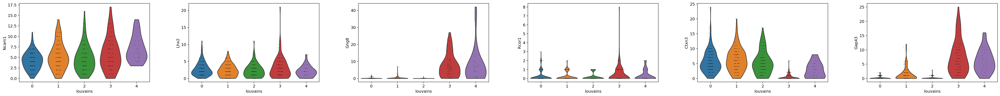

In [ ]:
#Expression of Immature neuron marker to assign clusters their stage
immature_neuron_markers = ["Ncam1","Lhx2","Gng8", "Rcor1","Ctxn3","Gap43"]
scp.pl.violin(fdata, keys=immature_neuron_markers, groupby='louvains', save = 'immature_neurons3_exp.pdf')

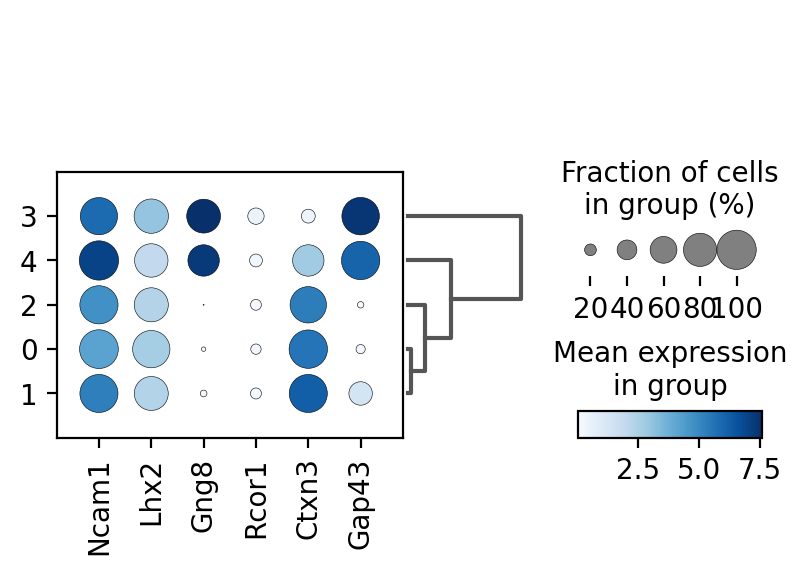

In [ ]:
scp.pl.dotplot(fdata, immature_neuron_markers,dendrogram=True, cmap='Blues', groupby='louvains', save = 'dotplot-immature3-exp.pdf')

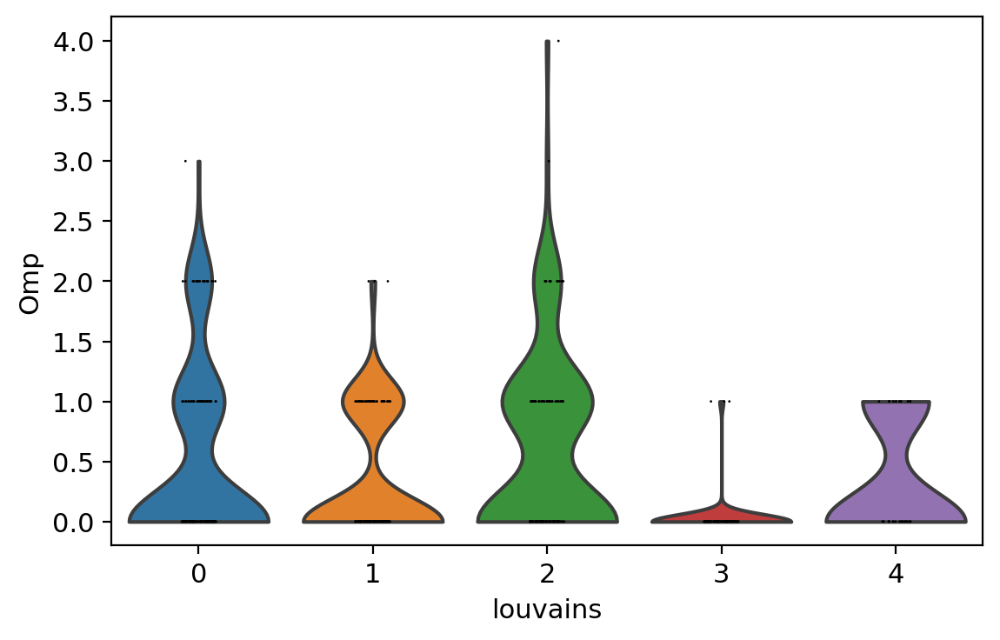

In [ ]:
#Mature neuron markers to name the clusters on basis of stage
mature_neuron_markers = ["Omp"]
scp.pl.violin(fdata, keys=mature_neuron_markers, groupby='louvains', save = 'mature2-exp.pdf')

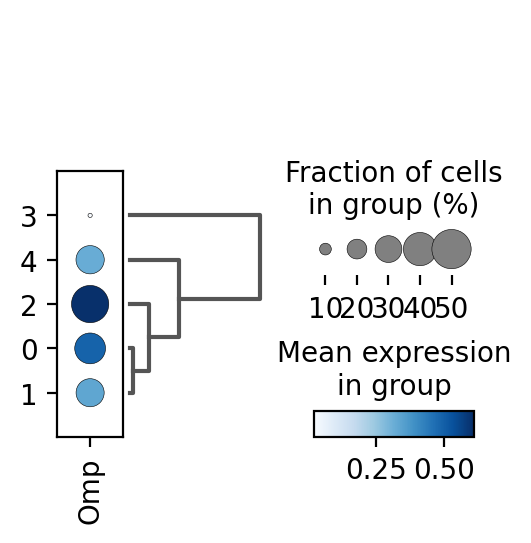

In [ ]:
scp.pl.dotplot(fdata, mature_neuron_markers,dendrogram=True, cmap='Blues', groupby='louvains', save = 'dotplot-mature2-exp.pdf')

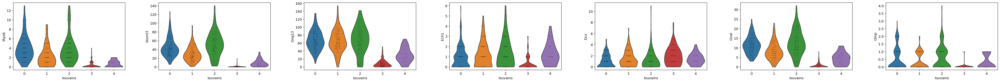

In [ ]:
#Mature neuron markers to name the clusters on basis of stage
mature_neuron_markers = ["Myo6", "Stoml3",
                           "Gng13","Ech1","Dcx","Gnal", "Omp"]
scp.pl.violin(fdata, keys=mature_neuron_markers, groupby='louvains', save = 'mature3-exp.pdf')

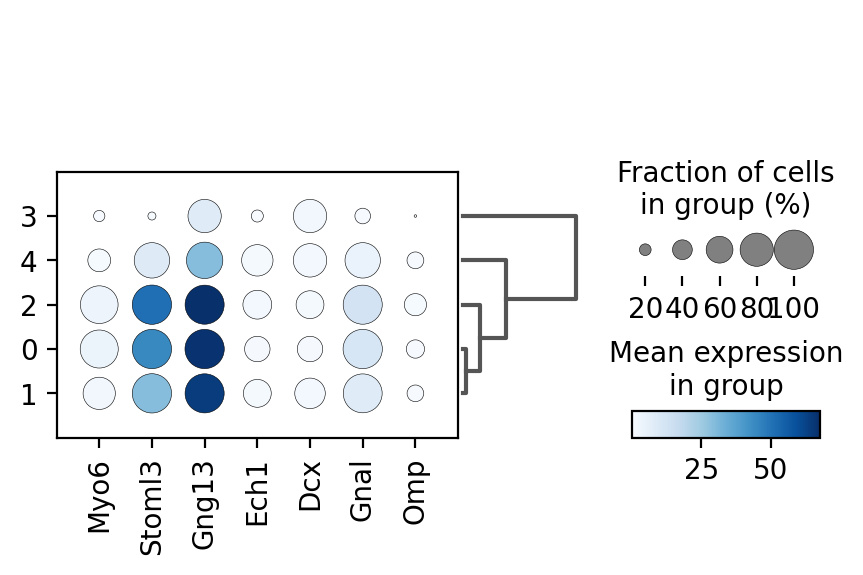

In [ ]:
scp.pl.dotplot(fdata, mature_neuron_markers,dendrogram=True, cmap='Blues', groupby='louvains', save = 'dotplot-mature3-exp.pdf')

#Final cluster names


In [ ]:
final.obs['celltype'] = 'Mature cells'
final.obs['celltype'][final.obs['louvain']=='3'] = 'Immature cells'
final.obs['celltype'][final.obs['louvain']=='4'] = 'Transition cells'

figure cannot be saved as pdf, using png instead.
saving figure to file ./figures/scvelo_velocity_embedding_stream.png


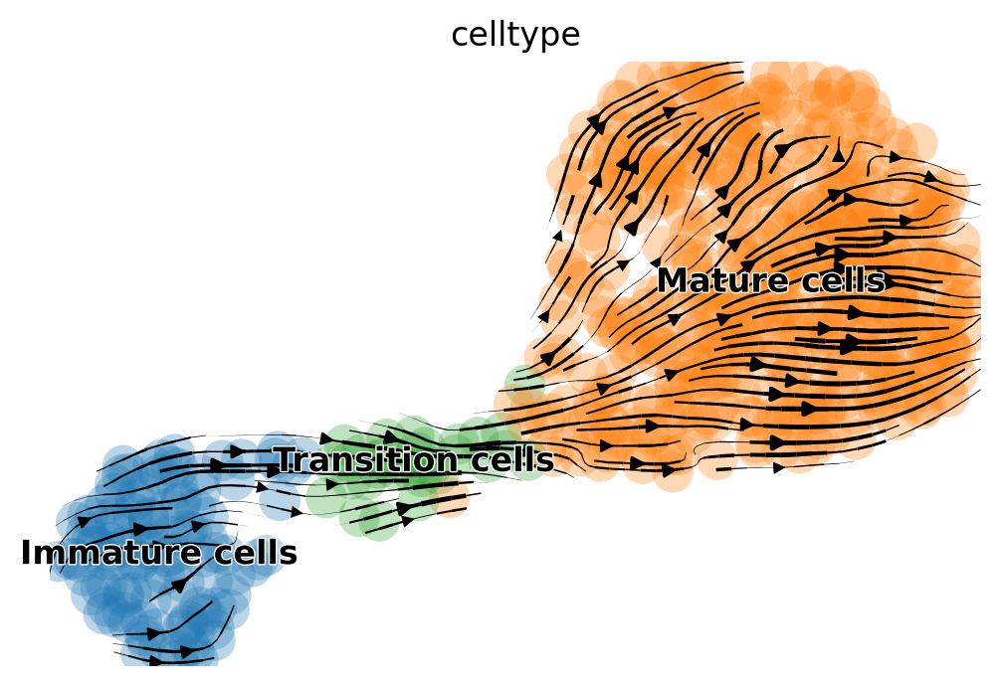

In [ ]:
scv.pl.velocity_embedding_stream(final, basis = 'umap', color = 'celltype',save= 'velocity_embedding_stream.pdf')

In [ ]:
k = final.obs['celltype']
ddata.obs['celltype'] = k

In [ ]:
markers = ["Ncam1","Lhx2","Gng8", "Rcor1","Ctxn3","Gap43", "Myo6", "Stoml3",
                           "Gng13","Ech1","Dcx","Gnal", "Omp"]

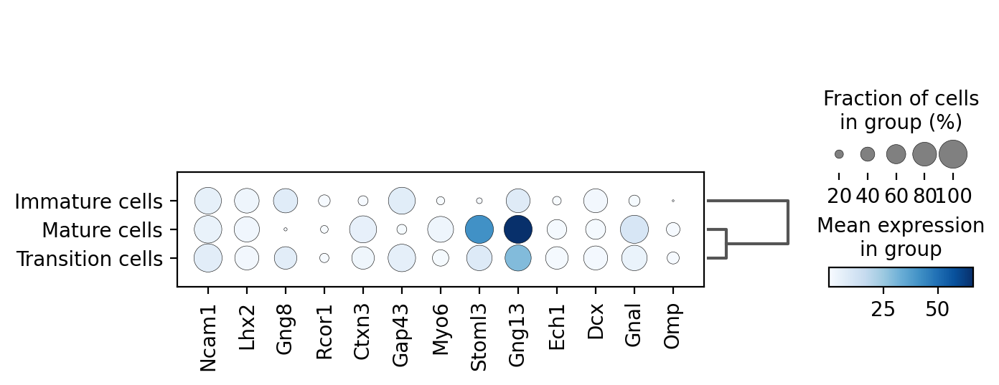

In [ ]:
scp.pl.dotplot(ddata, markers,dendrogram=True, cmap='Blues', groupby='celltype', save = 'dotplot_all_markers2.pdf')

EXTRACTING BARCODES

In [ ]:
f = final

In [ ]:
f

AnnData object with n_obs × n_vars = 593 × 2000
    obs: 'Clusters', '_X', '_Y', 'n_genes', 'n_genes_by_counts', 'total_counts', 'total_counts_mt', 'pct_counts_mt', 'CellID', 'initial_size_spliced', 'initial_size_unspliced', 'initial_size', 'n_counts', 'velocity_self_transition', 'louvain', 'celltype'
    var: 'Accession', 'Chromosome', 'End', 'Start', 'Strand', 'n_cells', 'mt', 'n_cells_by_counts', 'mean_counts', 'pct_dropout_by_counts', 'total_counts', 'Gene', 'gene_count_corr', 'means', 'dispersions', 'dispersions_norm', 'highly_variable', 'velocity_gamma', 'velocity_qreg_ratio', 'velocity_r2', 'velocity_genes'
    uns: 'pca', 'neighbors', 'velocity_params', 'velocity_graph', 'velocity_graph_neg', 'umap', 'louvain', 'louvain_colors', 'celltype_colors'
    obsm: 'X_pca', 'X_umap', 'velocity_umap'
    varm: 'PCs'
    layers: 'matrix', 'ambiguous', 'spliced', 'unspliced', 'Ms', 'Mu', 'velocity', 'variance_velocity'
    obsp: 'distances', 'connectivities'

In [ ]:
trans = f[f.obs['celltype'] == 'Transition cells']
mature = f[f.obs['celltype'] == 'Mature cells']
immature = f[f.obs['celltype'] == 'Immature cells']

In [ ]:
trans_bar = pd.DataFrame(trans.obs.index.tolist())
mat_bar = pd.DataFrame(mature.obs.index.tolist())
imm_bar = pd.DataFrame(immature.obs.index.tolist())

In [ ]:
trans_bar.shape

(31, 1)

In [ ]:
mat_bar.shape

(446, 1)

In [ ]:
imm_bar.shape

(116, 1)

In [ ]:
trans_bar.to_csv('transition_barcodes.csv')
mat_bar.to_csv('mature_barcodes.csv')
imm_bar.to_csv('immature_barcodeds')

# CLUSTER SEGREGATION TO FIND THEIR IDENTITY IN R




IMMATURE

In [ ]:
clus = (f.obs["celltype"]  == "Immature cells")
clus1 = f[clus].copy()

In [ ]:
clus1_ind = clus1.obs_names

In [ ]:
clus1_list = clus1_ind.to_list()
clust1 = adata[clus1_list, :]

Umap coordinates

In [ ]:
umap1 = clus1.obsm['X_umap']
umap1 = pd.DataFrame(umap1)
umap1.index = clus1.obs_names

In [ ]:
umap1.to_csv('umapimmat.csv')

spliced of mature --- 1

In [ ]:
spl1 = clust1.layers['spliced']
spl1 = spl1.todense()
spl1 = pd.DataFrame(spl1)

In [ ]:
spl1.columns = clust1.var_names
spl1.index = clust1.obs_names

In [ ]:
spl1.to_csv('splimmat.csv')

Unspliced of mature

In [ ]:
uspl1 = clust1.layers['unspliced']
uspl1 = uspl1.todense()
uspl1 = pd.DataFrame(uspl1)

In [ ]:
uspl1.columns = clust1.var_names
uspl1.index = clust1.obs_names

In [ ]:
uspl1.to_csv('usplimma.csv')

TRANSITION

In [ ]:
#cluster0 TRANSITION
clus = (f.obs["celltype"]  == "Transition cells")
clus0 = f[clus].copy()

In [ ]:
clus0_ind = clus0.obs_names
clus0_list = clus0_ind.to_list()
#clus0_list = [sub[ : -2] for sub in clus0_ind]
clust0 = adata[clus0_list, :]

umap

In [ ]:
umap0 = clus0.obsm['X_umap']
umap0 = pd.DataFrame(umap0)
umap0.index = clus0.obs_names

In [ ]:
umap0.to_csv('umaptrans.csv')

spliced

In [ ]:
spl0 = clust0.layers['spliced']
spl0 = spl0.todense()
spl0 = pd.DataFrame(spl0)
spl0.columns = clust0.var_names
spl0.index = clust0.obs_names

In [ ]:
spl0.to_csv('spltrans.csv')

In [ ]:
uspl0 = clust0.layers['unspliced']
uspl0 = uspl0.todense()
uspl0 = pd.DataFrame(uspl0)

In [ ]:
uspl0.columns = clust0.var_names
uspl0.index = clust0.obs_names

In [ ]:
uspl0.to_csv('uspltrans.csv')

#cluster mature

In [ ]:
clus = (f.obs["celltype"]  == "Mature cells")
clus4 = f[clus].copy()

In [ ]:
clus4_ind = clus4.obs_names
clus4_list = clus4_ind.to_list()
#clus4_list = [sub[ : -2] for sub in clus4_ind]
clust4 = adata[clus4_list, :]


umap

In [ ]:
umap4 = clus4.obsm['X_umap']
umap4 = pd.DataFrame(umap4)
umap4.index = clus4.obs_names

In [ ]:
umap4.to_csv('umapmature.csv')

spliced

In [ ]:
spl4 = clust4.layers['spliced']
spl4 = spl4.todense()
spl4 = pd.DataFrame(spl4)

In [ ]:
spl4.columns = clust4.var_names
spl4.index = clust4.obs_names

In [ ]:
spl4.to_csv('splmature.csv')

unspliced

In [ ]:
uspl4 = clust4.layers['unspliced']
uspl4 = uspl4.todense()
uspl4 = pd.DataFrame(uspl4)

In [ ]:
uspl4.columns = clust4.var_names
uspl4.index = clust4.obs_names

In [ ]:
uspl4.to_csv('usplmature.csv')

# Downstream analysis
IMPORTANT GENES

In [ ]:
#file with all genes
ddata = f
ddata.write_loom("downstream.loom", write_obsm_varm=True)

In [ ]:
scv.tl.rank_velocity_genes(f, groupby='celltype', min_corr=.3)
df = scv.DataFrame(f.uns['rank_velocity_genes']['names'])
df.head()

ranking velocity genes
    finished (0:00:00) --> added 
    'rank_velocity_genes', sorted scores by group ids (adata.uns) 
    'spearmans_score', spearmans correlation scores (adata.var)


,Immature cells,Mature cells,Transition cells
0,Cpsf6,Unc13c,2610037D02Rik
1,Runx1t1,Togaram2,Olfr1321
2,Zik1,Ric8b,Vwa3a
3,Dmpk,Susd4,Vim
4,Gm13762,Cdh23,Olfr370


In [ ]:
df.to_csv('rank_velocity_genes_wild.csv')

saving figure to file ./figures/scvelo_scatterplot_Immature_cells.pdf


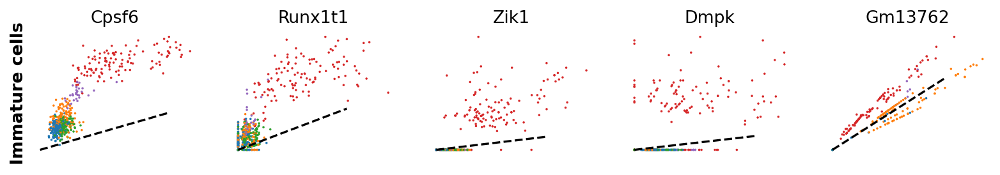

saving figure to file ./figures/scvelo_scatterplot_mature_cells.pdf


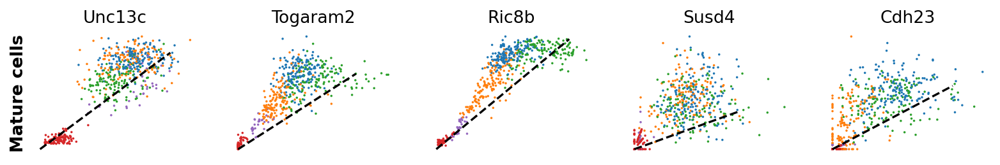

saving figure to file ./figures/scvelo_scatterplot_transition_cells.pdf


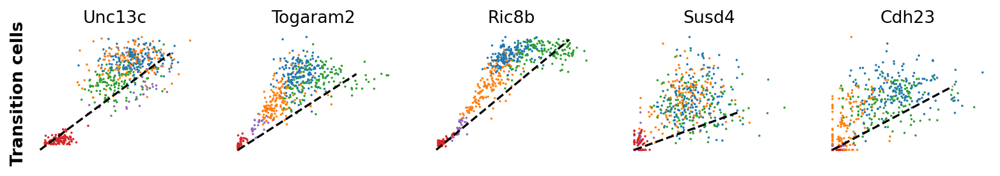

In [ ]:
#Expressions of velocity genes
kwargs = dict(frameon=False, size=10, linewidth=1.5)

scv.pl.scatter(f, df['Immature cells'][:5], ylabel='Immature cells', **kwargs, save = 'scatterplot_Immature_cells.pdf')
scv.pl.scatter(f, df['Mature cells'][:5], ylabel='Mature cells', **kwargs, save = 'scatterplot_mature_cells.pdf')
scv.pl.scatter(f, df['Mature cells'][:5], ylabel='Transition cells', **kwargs, save = 'scatterplot_transition_cells.pdf')


VELOCITIES IN CYCLING PROGENITOR

In [ ]:
gene = f.var_names.tolist()

In [ ]:
scv.logging.print_versions()

scvelo==0.2.4  scanpy==1.7.1  anndata==0.7.5  loompy==3.0.6  numpy==1.19.2  scipy==1.5.2  matplotlib==3.3.2  sklearn==0.23.2  pandas==1.1.3  


In [ ]:
scv.utils.get_phase_marker_genes(f)

(array([], dtype=float64), array([], dtype=float64))

saving figure to file ./figures/scvelo_Velocitygraph_Immature_cell.pdf


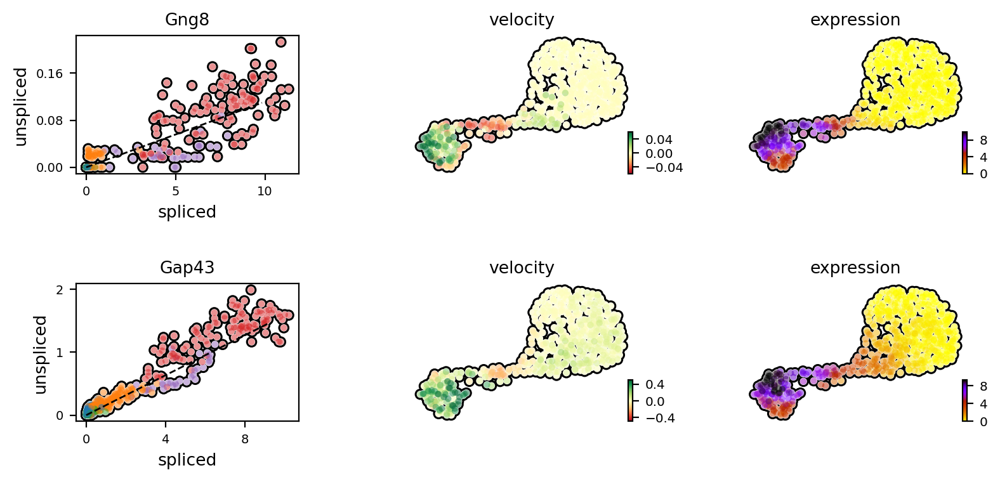

saving figure to file ./figures/scvelo_Velocitygraph_mature_cell.pdf


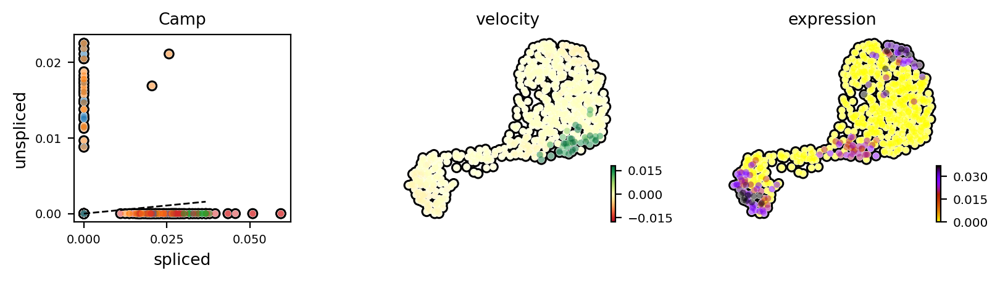

In [ ]:
scv.pl.velocity(f, ['Gng8', 'Gap43', 'Ctxn3'], add_outline=True, save= 'Velocitygraph_Immature_cell.pdf')
scv.pl.velocity(f, ['Gnal', 'Dcx', 'Camp'], add_outline = True, save= 'Velocitygraph_mature_cell.pdf')

SPEED AND COHERENCE

In [ ]:
f

AnnData object with n_obs × n_vars = 593 × 2000
    obs: 'Clusters', '_X', '_Y', 'n_genes', 'n_genes_by_counts', 'total_counts', 'total_counts_mt', 'pct_counts_mt', 'CellID', 'initial_size_spliced', 'initial_size_unspliced', 'initial_size', 'n_counts', 'velocity_self_transition', 'louvain', 'celltype'
    var: 'Accession', 'Chromosome', 'End', 'Start', 'Strand', 'n_cells', 'mt', 'n_cells_by_counts', 'mean_counts', 'pct_dropout_by_counts', 'total_counts', 'Gene', 'gene_count_corr', 'means', 'dispersions', 'dispersions_norm', 'highly_variable', 'velocity_gamma', 'velocity_qreg_ratio', 'velocity_r2', 'velocity_genes', 'spearmans_score', 'velocity_score'
    uns: 'pca', 'neighbors', 'velocity_params', 'velocity_graph', 'velocity_graph_neg', 'umap', 'louvain', 'louvain_colors', 'celltype_colors', 'rank_velocity_genes'
    obsm: 'X_pca', 'X_umap', 'velocity_umap'
    varm: 'PCs'
    layers: 'matrix', 'ambiguous', 'spliced', 'unspliced', 'Ms', 'Mu', 'velocity', 'variance_velocity'
    obsp: '

In [ ]:
scv.tl.velocity_confidence(f)

--> added 'velocity_length' (adata.obs)
--> added 'velocity_confidence' (adata.obs)
--> added 'velocity_confidence_transition' (adata.obs)


saving figure to file ./figures/scvelo_speed_and_coherence.pdf


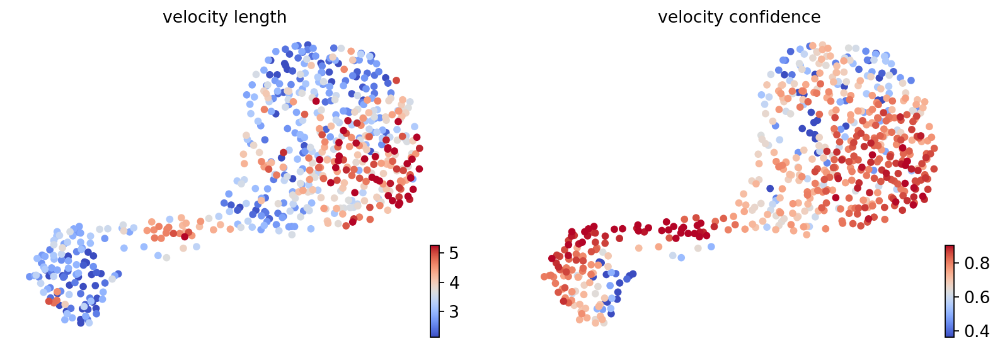

In [ ]:
keys = 'velocity_length', 'velocity_confidence'
scv.pl.scatter(f, c=keys, cmap='coolwarm', perc=[5, 95], color = 'celltype', save = 'speed_and_coherence.pdf')

In [ ]:
df = f.obs.groupby('celltype')[keys].mean().T
df.style.background_gradient(cmap='coolwarm', axis=1)

celltype,Immature cells,Mature cells,Transition cells
velocity_length,2.793448,3.621614,4.231936
velocity_confidence,0.725227,0.707533,0.844494


In [ ]:
df.to_csv('velocity_data.csv')

VELOCITY GRAPH AND PSEUDOTIME

saving figure to file ./figures/scvelo_Velocity_graph.pdf


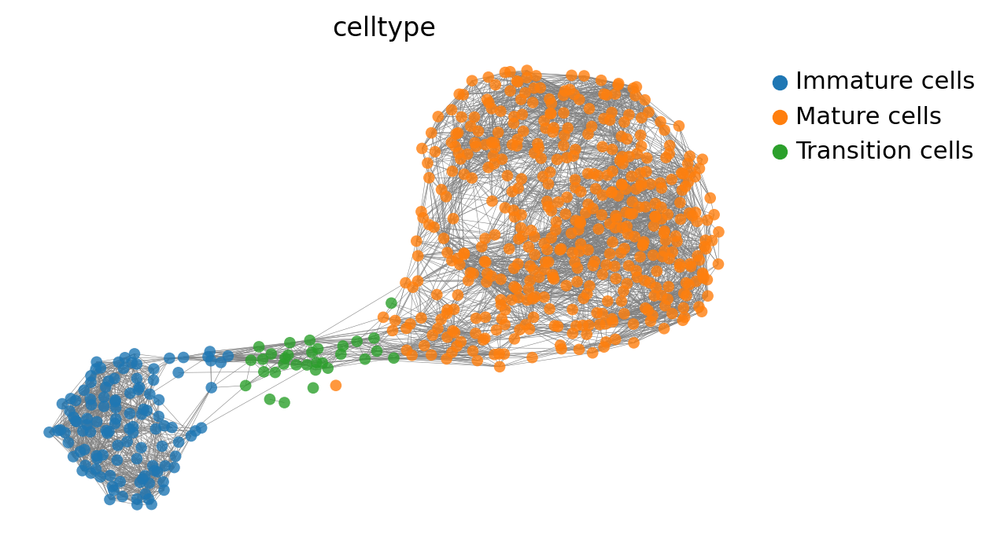

In [ ]:
scv.pl.velocity_graph(f, threshold=.1, color='celltype', save = 'Velocity_graph.pdf')

saving figure to file ./figures/scvelo_descendants-ancestor-cell.pdf


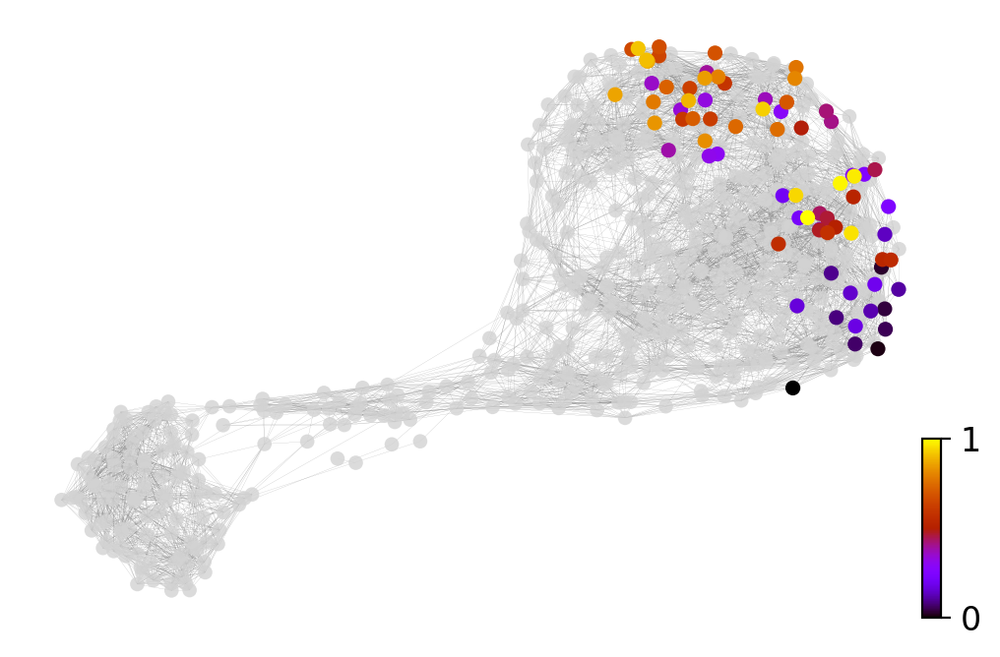

In [ ]:
x, y = scv.utils.get_cell_transitions(f, basis='umap', starting_cell= 100)
ax = scv.pl.velocity_graph(f, c='lightgrey', edge_width=.05, show=False)
ax = scv.pl.scatter(f, x=x, y=y, s=120, c='ascending', cmap='gnuplot', ax=ax, save='descendants-ancestor-cell.pdf')

computing terminal states
    identified 2 regions of root cells and 1 region of end points .
    finished (0:00:00) --> added
    'root_cells', root cells of Markov diffusion process (adata.obs)
    'end_points', end points of Markov diffusion process (adata.obs)
saving figure to file ./figures/scvelo_pseudotime.pdf


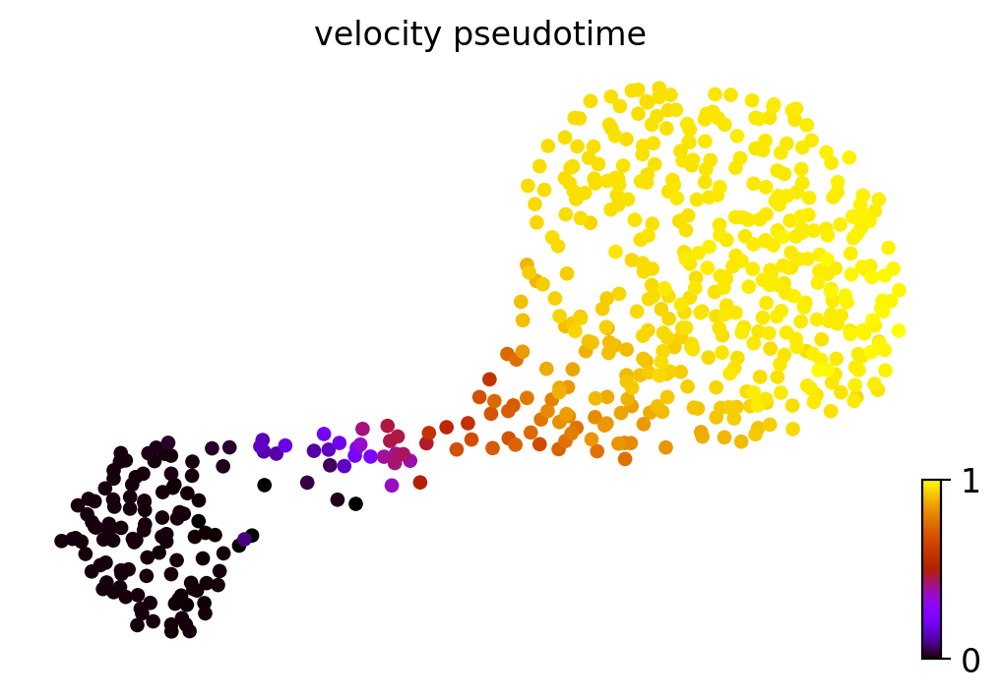

In [ ]:
scv.tl.velocity_pseudotime(f)
scv.pl.scatter(f, color='velocity_pseudotime', cmap='gnuplot', save = 'pseudotime.pdf')

PAGA VELOCITY GRAPH

In [ ]:
f.uns['neighbors']['distances'] = f.obsp['distances']
f.uns['neighbors']['connectivities'] = f.obsp['connectivities']
scv.tl.paga(f, groups='celltype')
df = scv.get_df(f, 'paga/transitions_confidence', precision=2).T
df.style.background_gradient(cmap='Blues').format('{:.2g}')

running PAGA using priors: ['velocity_pseudotime']
    finished (0:00:00) --> added
    'paga/connectivities', connectivities adjacency (adata.uns)
    'paga/connectivities_tree', connectivities subtree (adata.uns)
    'paga/transitions_confidence', velocity transitions (adata.uns)


,Immature cells,Mature cells,Transition cells
Immature cells,0,0,0.21
Mature cells,0,0,0
Transition cells,0,0.14,0


saving figure to file ./figures/scvelo_PAGA.pdf


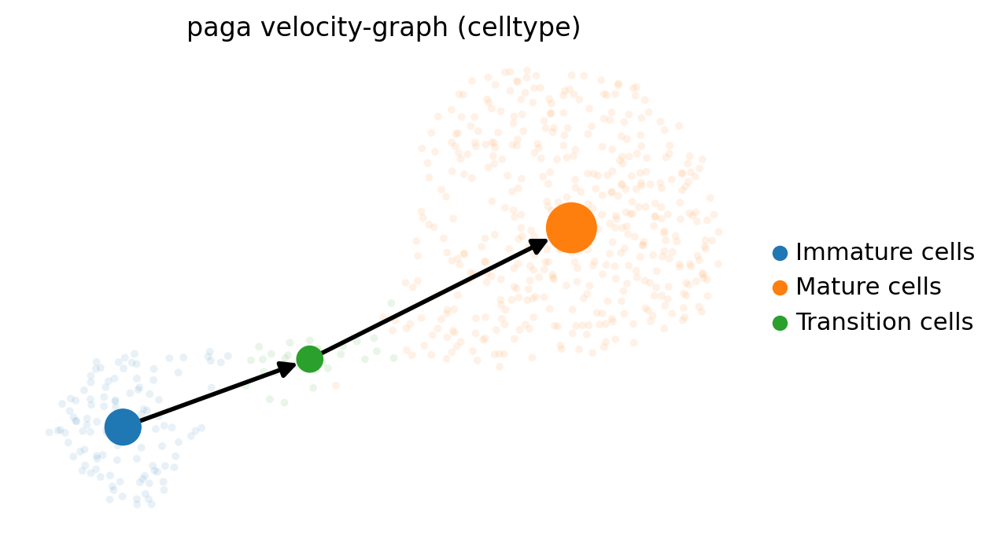

In [ ]:
scv.pl.paga(f, basis='umap', size=50, alpha=.1,
            min_edge_width=2, node_size_scale=1.5, save = 'PAGA.pdf')

# Dynamical modeling

In [ ]:
scv.tl.recover_dynamics(f)

recovering dynamics (using 1/20 cores)



    finished (0:00:37) --> added 
    'fit_pars', fitted parameters for splicing dynamics (adata.var)


/home/sanjay/anaconda3/lib/python3.8/site-packages/scvelo/tools/dynamical_model.py:713: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray
  np.array([dm.alpha, dm.beta, dm.gamma, dm.pars[:3]]) / dm.m[-1]
/home/sanjay/anaconda3/lib/python3.8/site-packages/scvelo/tools/dynamical_model.py:716: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray
  np.array([dm.t, dm.tau, dm.t_, dm.pars[4]]) * dm.m[-1]


In [ ]:
scv.tl.velocity(f, mode='dynamical')
scv.tl.velocity_graph(f)

computing velocities
    finished (0:00:00) --> added 
    'velocity', velocity vectors for each individual cell (adata.layers)
computing velocity graph (using 1/20 cores)



    finished (0:00:00) --> added 
    'velocity_graph', sparse matrix with cosine correlations (adata.uns)


/home/sanjay/anaconda3/lib/python3.8/site-packages/scvelo/core/_parallelize.py:138: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray
  res = np.array(res) if as_array else res


computing velocity embedding
    finished (0:00:00) --> added
    'velocity_umap', embedded velocity vectors (adata.obsm)
figure cannot be saved as pdf, using png instead.
saving figure to file ./figures/scvelo_differential_velocity_stream.png


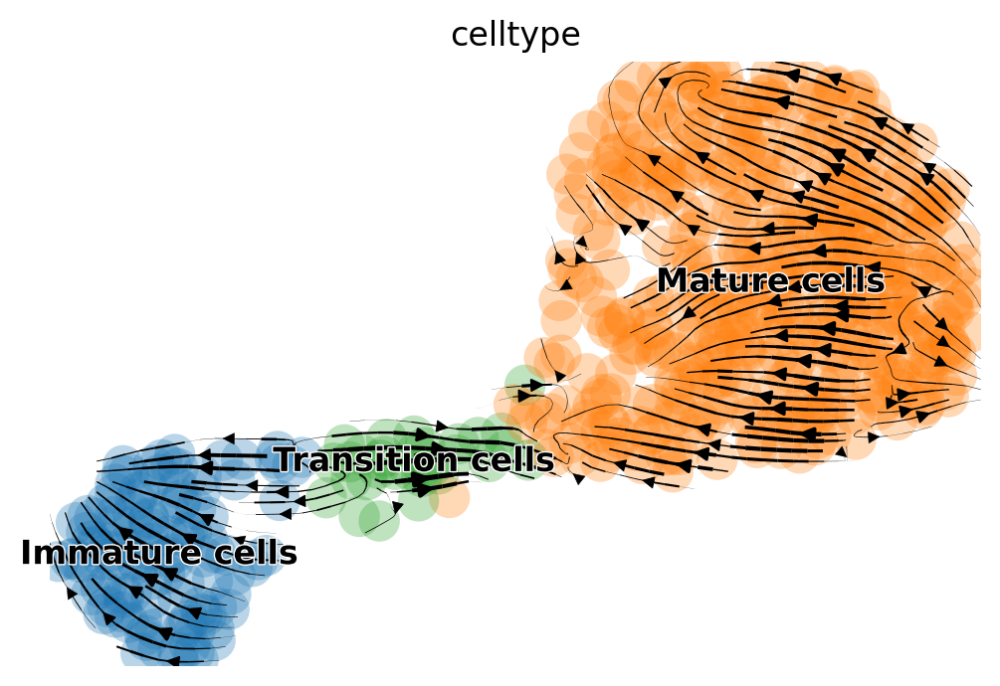

In [ ]:
scv.pl.velocity_embedding_stream(f, basis='umap', color = 'celltype', save = 'differential_velocity_stream.pdf')

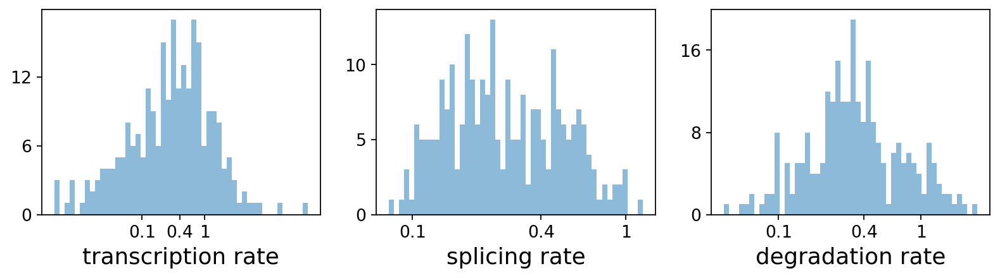

/home/sanjay/anaconda3/lib/python3.8/site-packages/scvelo/core/_anndata.py:311: UserWarning: Pandas doesn't allow columns to be created via a new attribute name - see https://pandas.pydata.org/pandas-docs/stable/indexing.html#attribute-access
  df.var_names = df.index


,fit_alpha,fit_beta,fit_gamma,fit_t_,fit_scaling,fit_std_u,fit_std_s,fit_likelihood,fit_u0,fit_s0,fit_pval_steady,fit_steady_u,fit_steady_s,fit_variance,fit_alignment_scaling,fit_r2
Stk17b,0.08,1.38,1.01,12.55,3.28e-01,1.27e-02,0.02,3.17e-01,0.0,0.0,1.23e-02,0.04,0.05,0.34,1.00,0.33
Sphkap,0.20,0.15,0.28,14.40,1.18e+00,4.97e-01,0.20,9.85e-01,0.0,0.0,3.80e-01,1.13,0.50,0.04,2.68,0.99
Olfr1414,0.69,36.64,0.88,10.74,9.31e-03,3.72e-03,0.17,3.96e-03,0.0,0.0,3.16e-01,0.02,0.81,0.08,1.36,1.00
Rnf152,0.05,0.28,0.16,16.69,9.83e-01,5.37e-02,0.07,2.21e-01,0.0,0.0,1.16e-02,0.17,0.21,1.02,4.17,0.33
Ptprc,0.01,0.42,0.23,24.98,2.70e-01,7.08e-03,0.01,3.12e-01,0.0,0.0,3.32e-08,0.03,0.04,0.49,4.65,0.95


In [ ]:
df = f.var
df = df[(df['fit_likelihood'] > .1) & df['velocity_genes'] == True]
kwargs = dict(xscale='log', fontsize=16)
with scv.GridSpec(ncols=3) as pl:
    pl.hist(df['fit_alpha'], xlabel='transcription rate',xticks=[.1, .4, 1], **kwargs)
    pl.hist(df['fit_beta'] * df['fit_scaling'], xlabel='splicing rate', xticks=[.1, .4, 1], **kwargs)
    pl.hist(df['fit_gamma'], xlabel='degradation rate', xticks=[.1, .4, 1], **kwargs)
    plt.savefig('trans-spl-deg.pdf')

scv.get_df(f, 'fit*', dropna=True).head()

In [ ]:
df.to_csv('trans-spli-degr-wild.csv')

computing latent time using root_cells as prior
    finished (0:00:00) --> added 
    'latent_time', shared time (adata.obs)
saving figure to file ./figures/scvelo_Latent_time.pdf


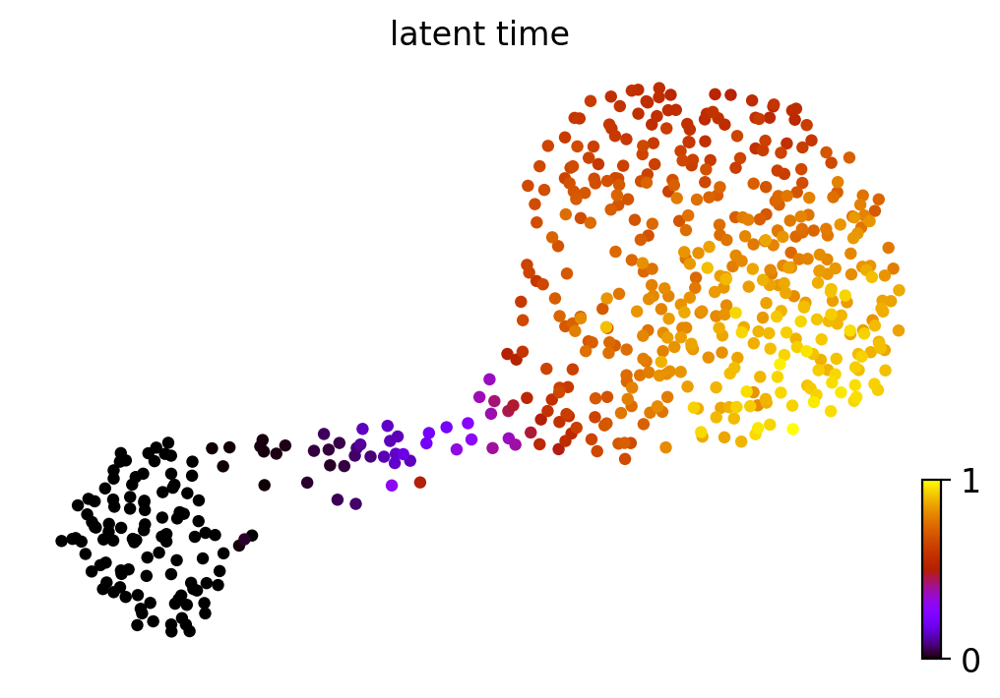

In [ ]:
scv.tl.latent_time(f)
scv.pl.scatter(f, color='latent_time', color_map='gnuplot', size=80, save = 'Latent_time.pdf')

saving figure to file ./figures/scvelo_heatmap_Toplikelihoodgenes_heatmap.pdf


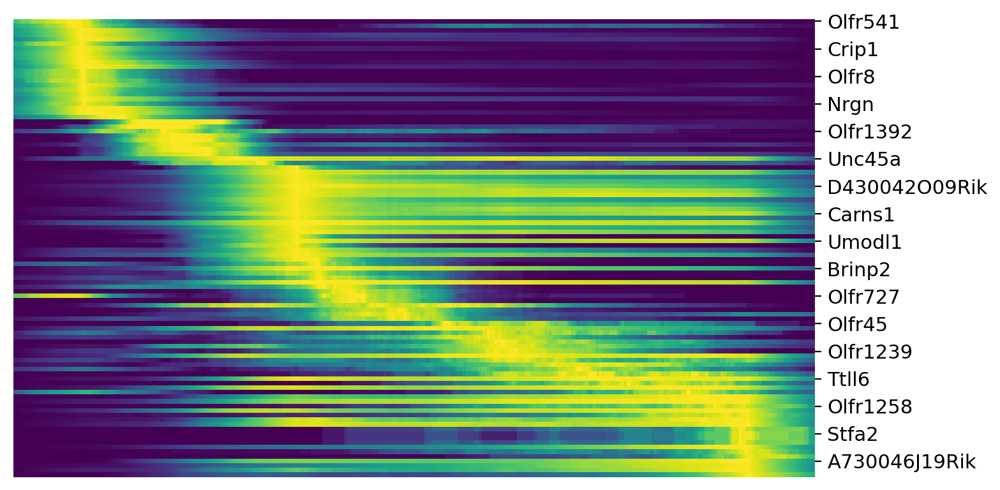

In [ ]:
top_genes = f.var['fit_likelihood'].sort_values(ascending=False).index[:100]
scv.pl.heatmap(f, var_names=top_genes, sortby='latent_time', n_convolve=100, save = 'Toplikelihoodgenes_heatmap.pdf')

TOP LIKELIHOOD GENES - DRIVER GENES

saving figure to file ./figures/scvelo_toplikelihood-15genes_scatterplot.pdf


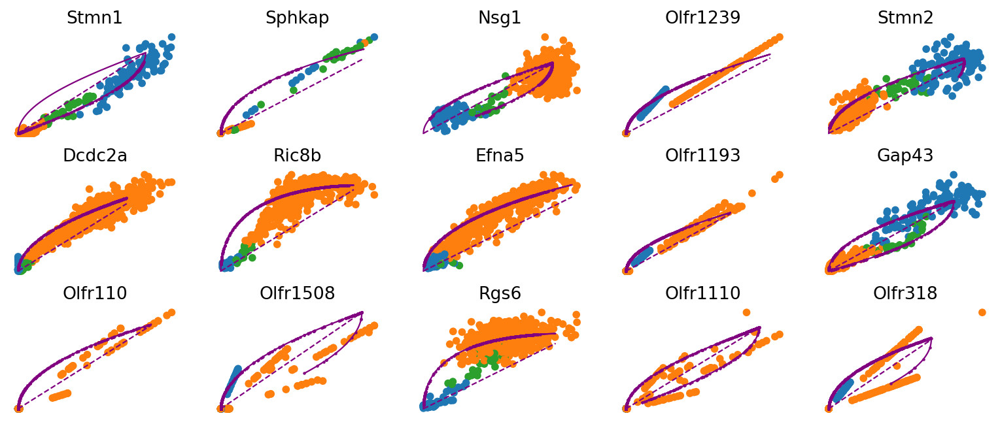

In [ ]:
top_genes = f.var['fit_likelihood'].sort_values(ascending=False).index
scv.pl.scatter(f, basis=top_genes[:15], ncols=5, frameon=False, color = 'celltype',save = 'toplikelihood-15genes_scatterplot')

CLUSTER SPECIFIC TOP LIKELIHOOD GENES

In [ ]:
scv.tl.rank_dynamical_genes(f, groupby='celltype')
df = scv.get_df(f, 'rank_dynamical_genes/names')
df.head(5)

ranking genes by cluster-specific likelihoods
    finished (0:00:00) --> added 
    'rank_dynamical_genes', sorted scores by group ids (adata.uns)


,Immature cells,Mature cells,Transition cells
0,Stmn1,Nsg1,Sphkap
1,Olfr1392,Olfr1239,Stmn1
2,Stmn2,Efna5,Olfr68
3,Olfr1262,Dcdc2a,Emx1
4,Olfr698,Ric8b,Nsg1


In [ ]:
df.to_csv('rank_dynamical_genes.csv')

saving figure to file ./figures/scvelo_cluster-specific_likelihood_genes{x}Immature cells.pdf


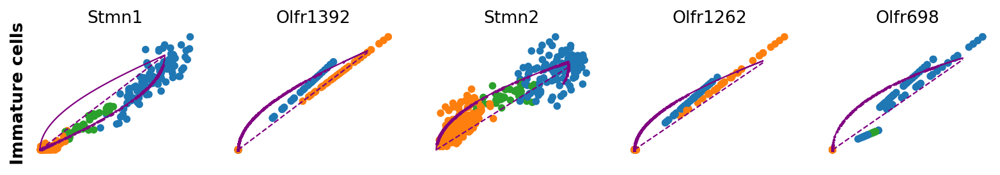

saving figure to file ./figures/scvelo_cluster-specific_likelihood_genes{x}Mature cells.pdf


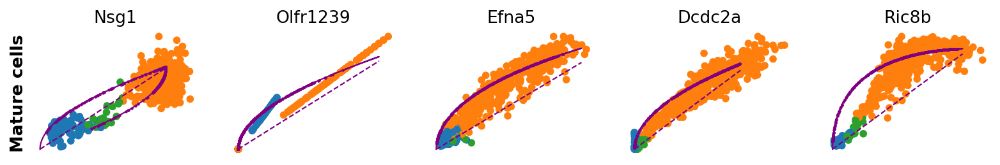

In [ ]:
for cluster in ['Immature cells', 'Mature cells']:
    scv.pl.scatter(f, df[cluster][:5], ylabel=cluster, frameon=False, color = 'celltype', save= 'cluster-specific_likelihood_genes{x}'+cluster)


# CELL RANK

In [ ]:
cr.tl.terminal_states(f, weight_connectivities=0.2,cluster_key='celltype')

saving figure to file ./figures/scvelo_cellrank_Terminalstates.pdf


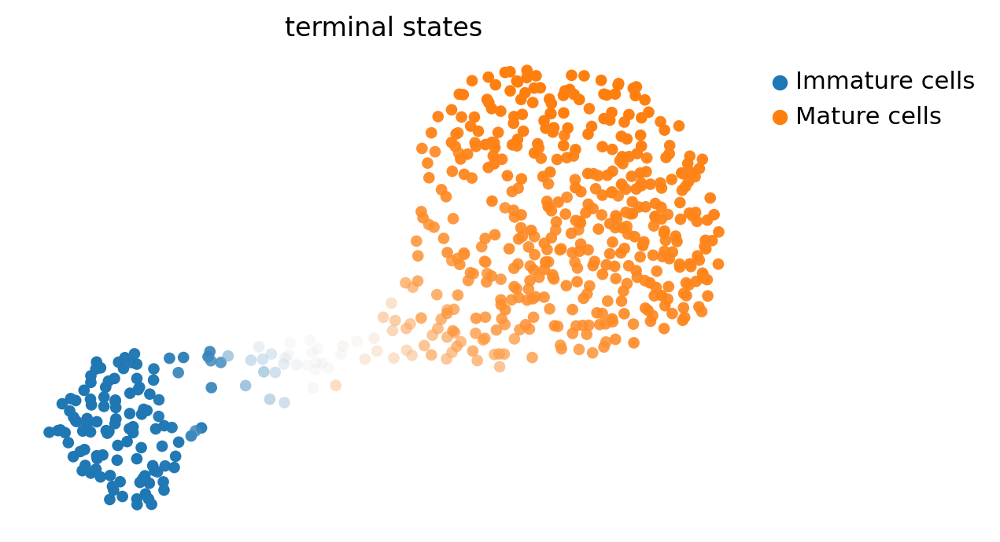

In [ ]:
cr.pl.terminal_states(f, cluster_key='celltype', save = 'cellrank_Terminalstates.pdf')


saving figure to file ./figures/scvelo_cellrank_initialstates.pdf


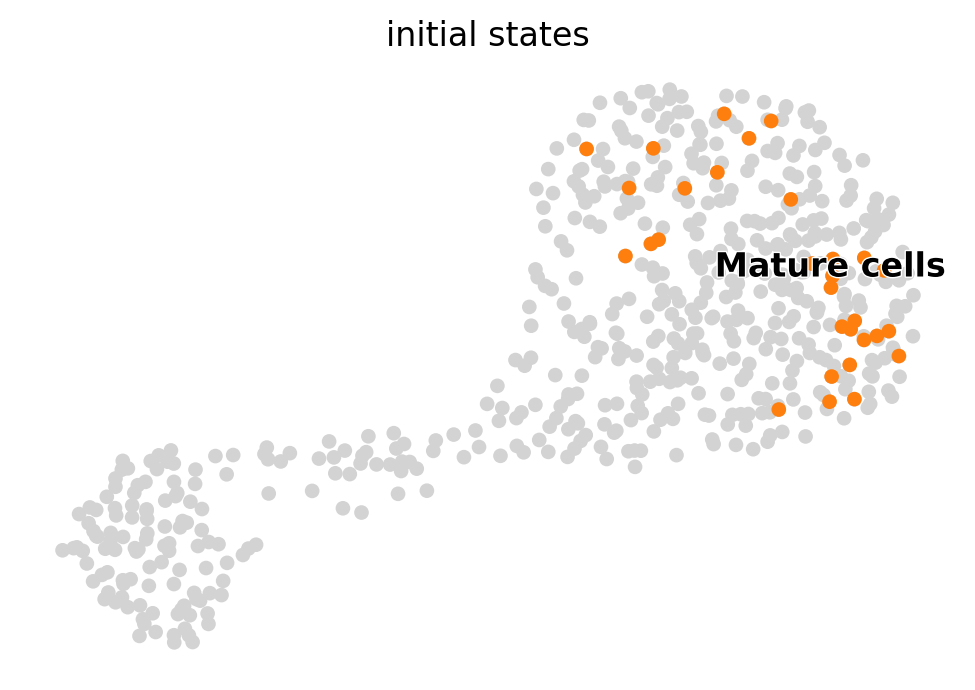

In [ ]:
cr.tl.initial_states(f, cluster_key='celltype')
cr.pl.initial_states(f, discrete=True, save = 'cellrank_initialstates.pdf')

saving figure to file ./figures/scvelo_cellrank_lineages.pdf


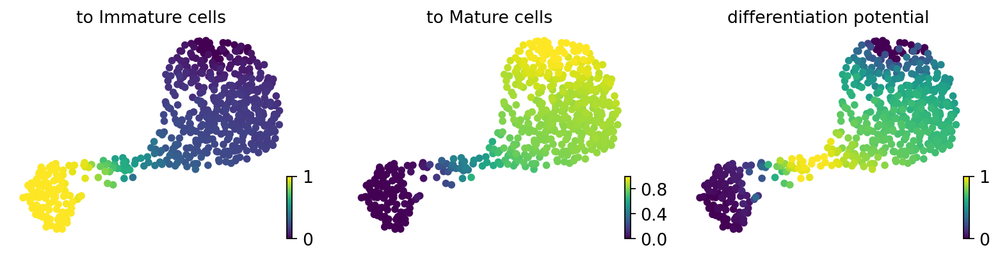

In [ ]:
cr.tl.lineages(f)
cr.pl.lineages(f, same_plot=False,rescale_color = [0,1], save = 'cellrank_lineages.pdf')

In [ ]:
scv.tl.latent_time(f, root_key= 'initial_state_probs', end_key='terminal_states_probs')

computing latent time using root_cells, terminal_states_probs as prior
    finished (0:00:00) --> added 
    'latent_time', shared time (adata.obs)


In [ ]:
scv.tl.paga(f, groups='celltype', root_key='initial_state_probs', end_key='terminal_states_probs',
            use_time_prior='velocity_pseudotime')

running PAGA using priors: ['velocity_pseudotime', 'terminal_states_probs']
    finished (0:00:00) --> added
    'paga/connectivities', connectivities adjacency (adata.uns)
    'paga/connectivities_tree', connectivities subtree (adata.uns)
    'paga/transitions_confidence', velocity transitions (adata.uns)


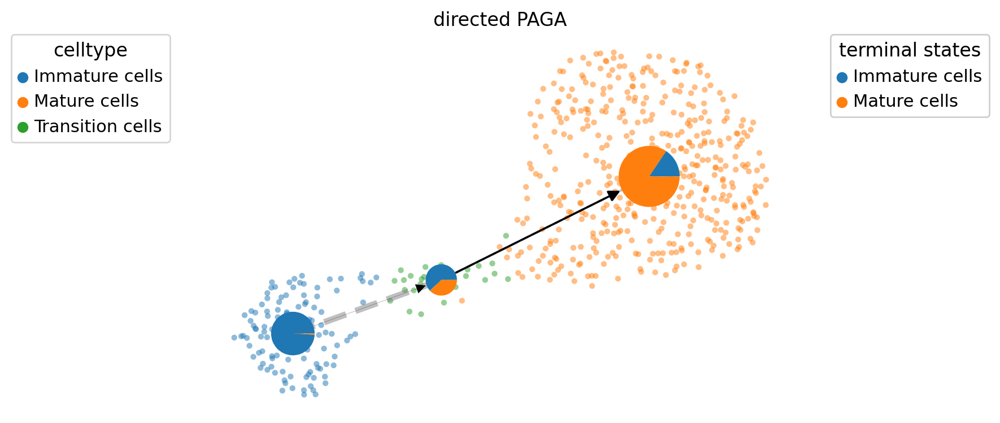

In [ ]:
cr.pl.cluster_fates(f, mode="paga_pie", cluster_key="celltype", basis='umap', 
                    legend_kwargs={'loc': 'top right out'}, legend_loc='top left out', 
                    node_size_scale=5, edge_width_scale=1, max_edge_width=4, title='directed PAGA', save = 'Cellrank-Differential_PAGA.pdf')

In [ ]:
cr.tl.lineage_drivers(f)

,Immature cells corr,Immature cells pval,Immature cells qval,Immature cells ci low,Immature cells ci high,Mature cells corr,Mature cells pval,Mature cells qval,Mature cells ci low,Mature cells ci high
Stmn1,0.92,0.00e+00,NaN,0.91,0.93,-0.92,0.00e+00,NaN,-0.93,-0.91
Sox11,0.91,1.76e-304,NaN,0.90,0.92,-0.91,1.76e-304,NaN,-0.92,-0.90
Vim,0.86,3.90e-214,NaN,0.84,0.88,-0.86,3.90e-214,NaN,-0.88,-0.84
Gap43,0.82,3.05e-174,NaN,0.79,0.85,-0.82,3.04e-174,NaN,-0.85,-0.79
Gng8,0.81,7.68e-162,NaN,0.78,0.83,-0.81,7.68e-162,NaN,-0.83,-0.78
...,...,...,...,...,...,...,...,...,...,...
Timp1,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
Gm5938,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
P2ry10,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
Tnmd,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


In [ ]:
root_idx = np.where(f.obs['celltype'] == 'Immature cells')[0][0]

In [ ]:
f.uns['iroot'] = root_idx

In [ ]:
scp.tl.dpt(f)

saving figure to file ./figures/scvelo_cellrank_combinedgraph.pdf


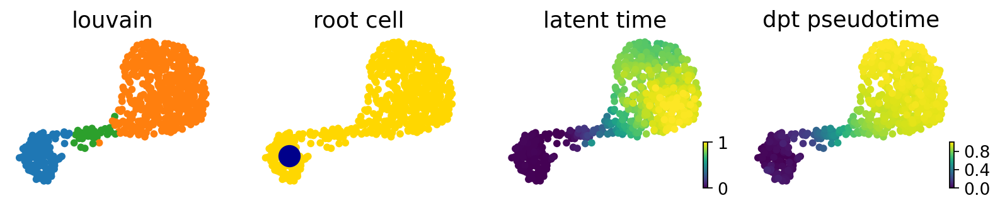

In [ ]:
# compue dpt, starting from CellRank defined root cell
scv.pl.scatter(f, color=['celltype', root_idx, 'latent_time', 'dpt_pseudotime'], fontsize=16,
               cmap='viridis', perc=[2, 98], colorbar=True, rescale_color=[0, 1],
               title=['louvain', 'root cell', 'latent time', 'dpt pseudotime'], save = 'cellrank_combinedgraph.pdf')

In [ ]:
model = cr.ul.models.GAM(f)

/home/sanjay/anaconda3/lib/python3.8/site-packages/cellrank/pl/_utils.py:625: UserWarning: This figure was using constrained_layout==True, but that is incompatible with subplots_adjust and or tight_layout: setting constrained_layout==False. 
  fig.tight_layout()


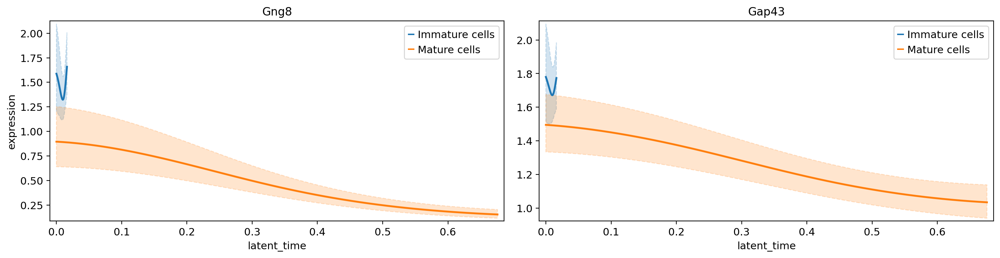

In [ ]:
cr.pl.gene_trends(f, model=model, data_key='X',
                  genes=['Gng8', 'Gap43'], ncols=2,
                  time_key='latent_time', same_plot=True, hide_cells=True,
                  figsize=(15, 4), n_test_points=200)

ADVANCE

In [ ]:
from cellrank.tl.kernels import VelocityKernel
vk = VelocityKernel(f)

In [ ]:
vk.compute_transition_matrix()

<Velo>

In [ ]:
from cellrank.tl.kernels import ConnectivityKernel
ck = ConnectivityKernel(f).compute_transition_matrix()

In [ ]:
combined_kernel = 0.8 * vk + 0.2 * ck
root_idx = np.where(f.obs['celltype'] == 'Immature cells')[0][0]
f.uns['iroot'] = root_idx


In [ ]:
from cellrank.tl.kernels import PalantirKernel
pk = PalantirKernel(f, time_key='dpt_pseudotime').compute_transition_matrix()
print(pk)

<Pala[k=3, dnorm=True, n_neighs=30]>


In [ ]:
from cellrank.tl.estimators import GPCCA
g = GPCCA(combined_kernel)
print(g)

GPCCA[n=593, kernel=((0.8 * <Velo[softmax_scale=1.47, mode=deterministic, seed=15256, scheme=<CorrelationScheme>]>) + (0.2 * <Conn[dnorm=True]>))]


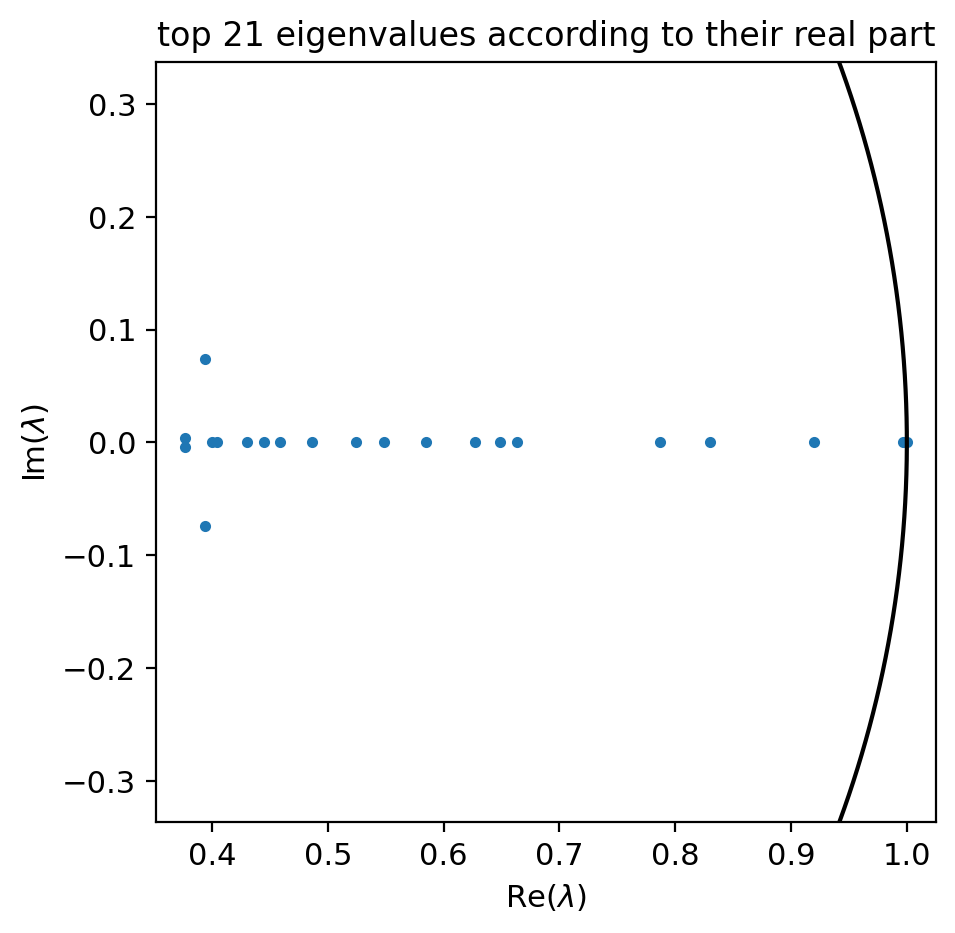

In [ ]:
g.compute_schur(n_components=20)
g.plot_spectrum(save='cellrank-eigenvalues.pdf')

saving figure to file ./figures/scvelo_cellrank-schurvector.pdf


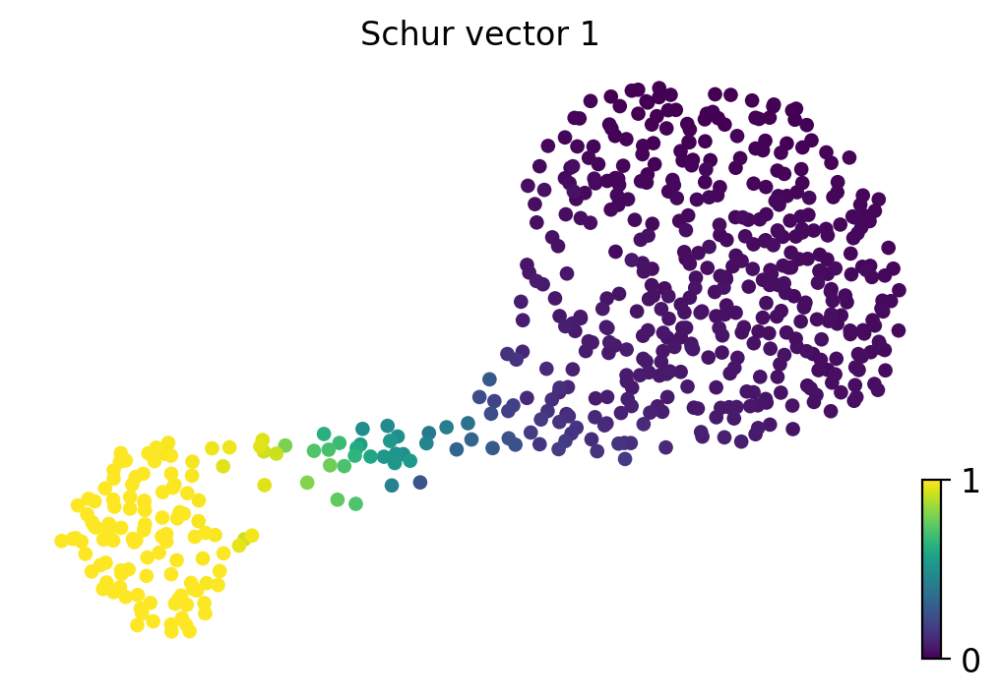

In [ ]:
g.plot_schur(use=1, rescale_color = [0,1], save='cellrank-schurvector.pdf')

saving figure to file ./figures/scvelo_cellrank-macrostates.pdf


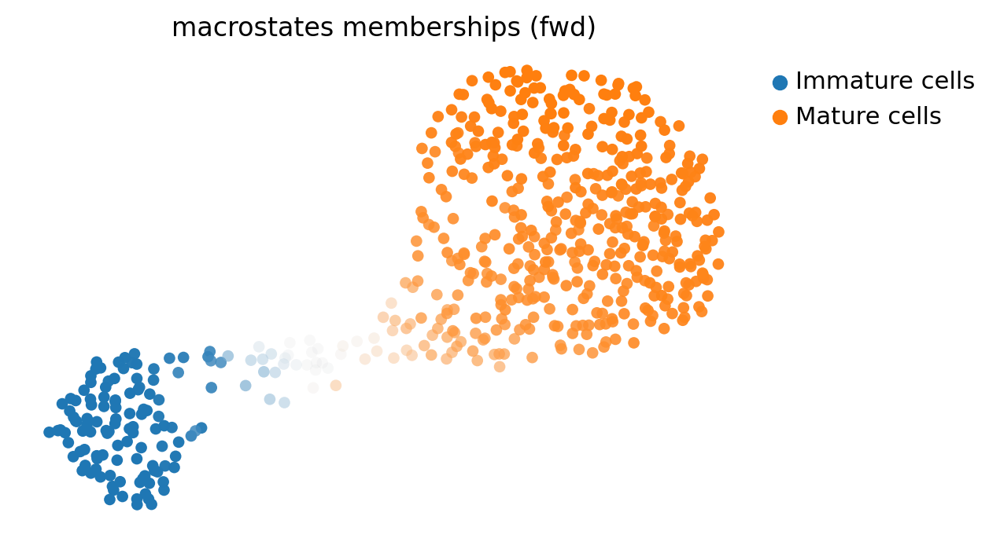

In [ ]:
g.compute_macrostates(n_states=2, cluster_key='celltype')
g.plot_macrostates(save = 'cellrank-macrostates.pdf')

saving figure to file ./figures/scvelo_cellrank-macrostates-diff-plots.pdf


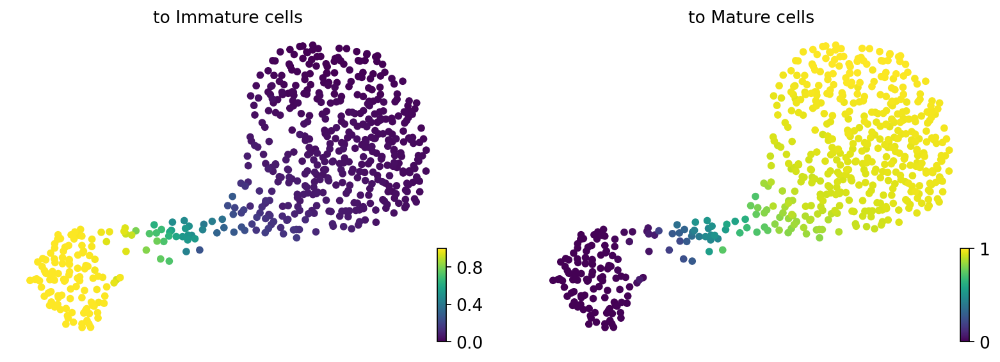

In [ ]:
g.plot_macrostates(same_plot=False, rescale_color = [0,1], save = 'cellrank-macrostates-diff-plots.pdf')

saving figure to file ./figures/scvelo_cellrank_macrostates-forward.pdf


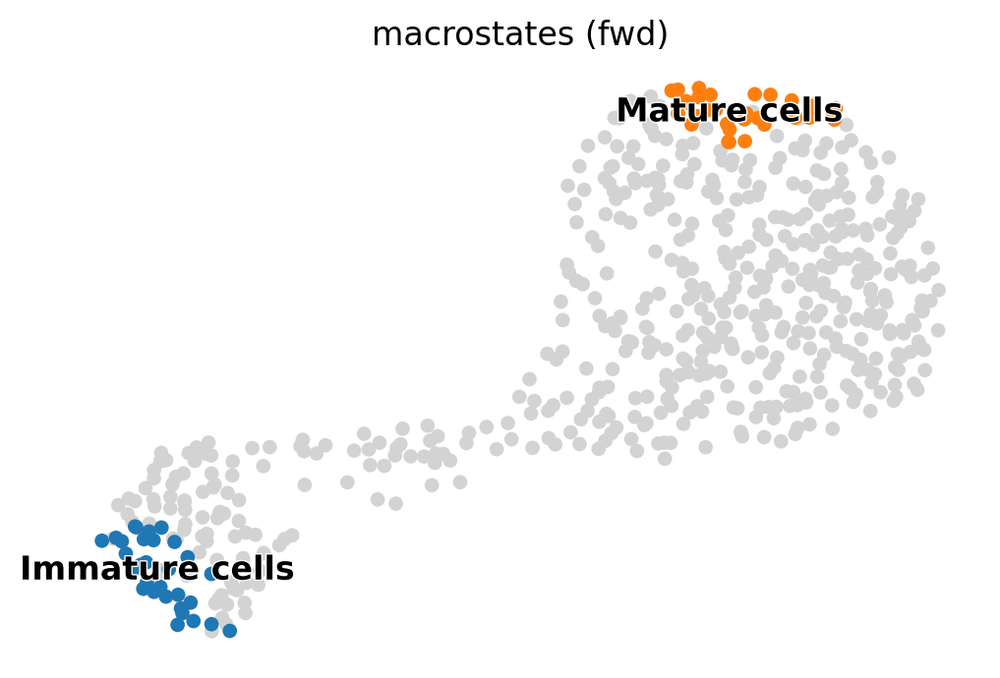

In [ ]:
g.plot_macrostates(discrete=True, save = 'cellrank_macrostates-forward.pdf')

In [ ]:
g.set_terminal_states_from_macrostates()

In [ ]:
g.compute_absorption_probabilities()

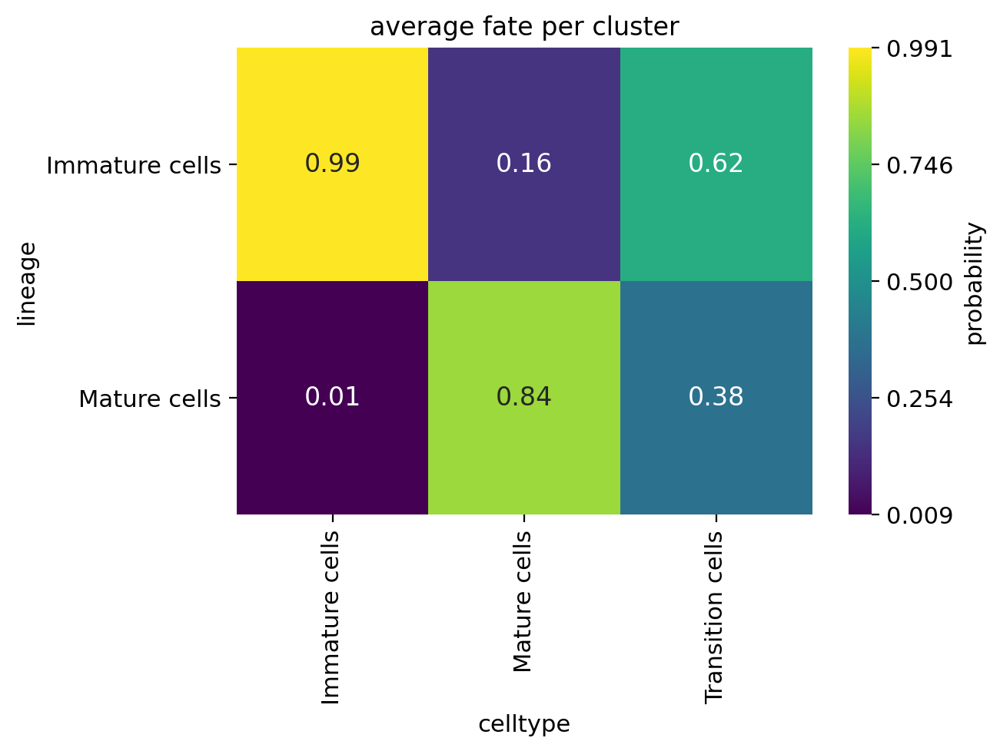

In [ ]:
cr.pl.cluster_fates(f, cluster_key='celltype', mode='heatmap', save = 'cellrank-heatmap-clusterfate.pdf')

# Differential kinetics

In [ ]:
scv.tl.differential_kinetic_test(f, groupby='celltype')


testing for differential kinetics
    finished (0:00:07) --> added 
    'fit_diff_kinetics', clusters displaying differential kinetics (adata.var)
    'fit_pvals_kinetics', p-values of differential kinetics (adata.var)


In [ ]:
var_names = ['Gap43', 'Gng8']

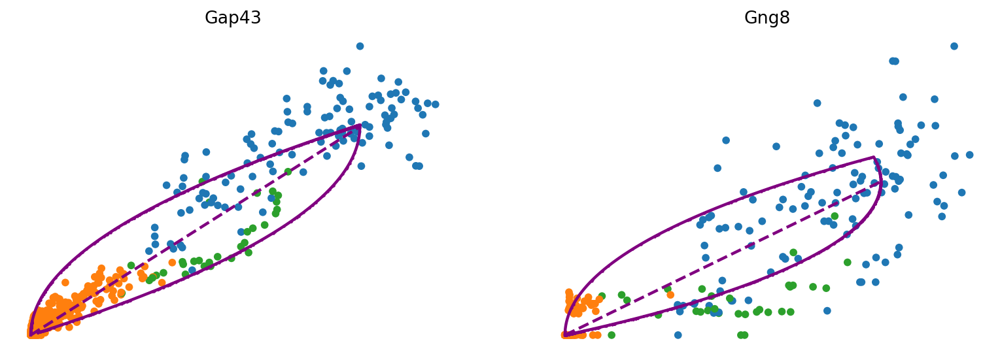

In [ ]:
kwargs = dict(linewidth=2, add_linfit=True, frameon=False)
scv.pl.scatter(f, basis=var_names, add_outline='fit_diff_kinetics', **kwargs)

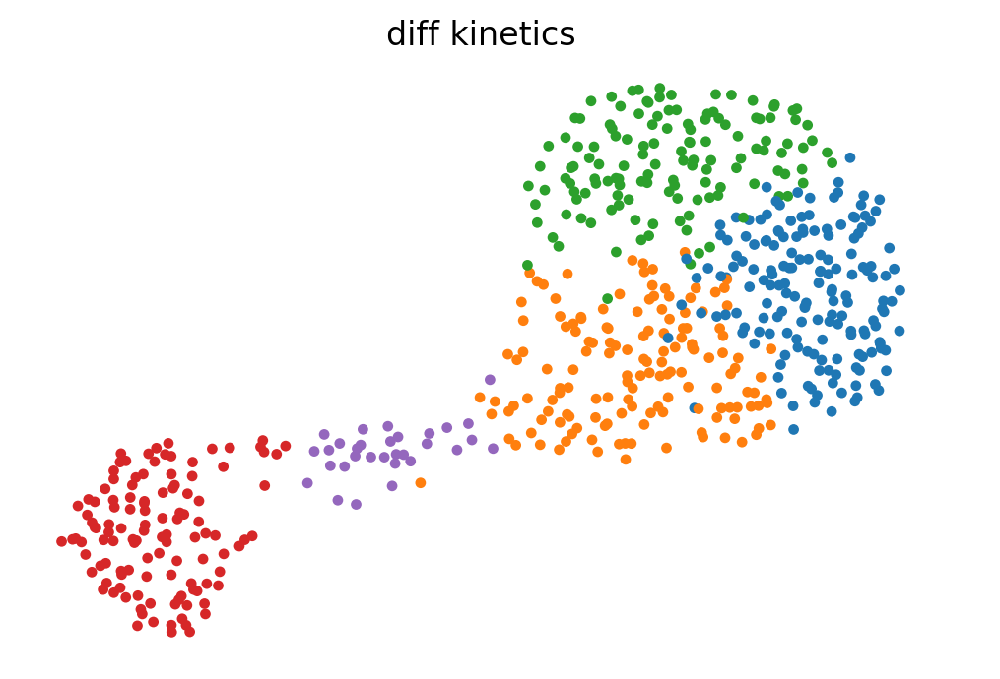

In [ ]:
diff_clusters=list(f[:, var_names].var['fit_diff_kinetics'])
scv.pl.scatter(f, legend_loc='right', size=60, title='diff kinetics',
               add_outline=diff_clusters)


TOP LIKELIHOOD genes

In [ ]:
scv.tl.recover_dynamics(f)


recovering dynamics (using 1/20 cores)



    finished (0:00:29) --> added 
    'fit_pars', fitted parameters for splicing dynamics (adata.var)


/home/sanjay/anaconda3/lib/python3.8/site-packages/scvelo/tools/dynamical_model.py:713: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray
  np.array([dm.alpha, dm.beta, dm.gamma, dm.pars[:3]]) / dm.m[-1]
/home/sanjay/anaconda3/lib/python3.8/site-packages/scvelo/tools/dynamical_model.py:716: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray
  np.array([dm.t, dm.tau, dm.t_, dm.pars[4]]) * dm.m[-1]


In [ ]:
top_genes = f.var['fit_likelihood'].sort_values(ascending=False).index[:100]
scv.tl.differential_kinetic_test(f, groupby='celltype')

testing for differential kinetics
    finished (0:00:07) --> added 
    'fit_diff_kinetics', clusters displaying differential kinetics (adata.var)
    'fit_pvals_kinetics', p-values of differential kinetics (adata.var)


saving figure to file ./figures/scvelo_differential-kinetics-15genes.pdf


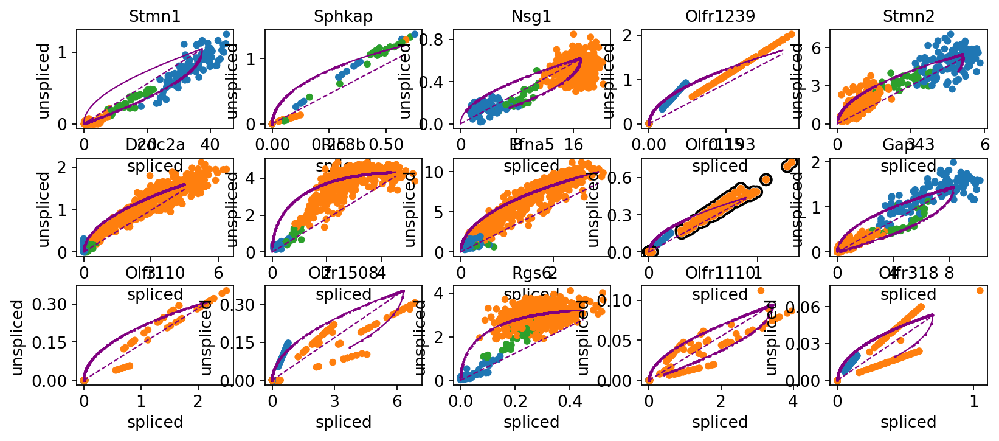

In [ ]:
scv.pl.scatter(f, basis=top_genes[:15], ncols=5, add_outline='fit_diff_kinetics', save = 'differential-kinetics-15genes.pdf')

saving figure to file ./figures/scvelo_differential-kinetics-15-30genes.pdf


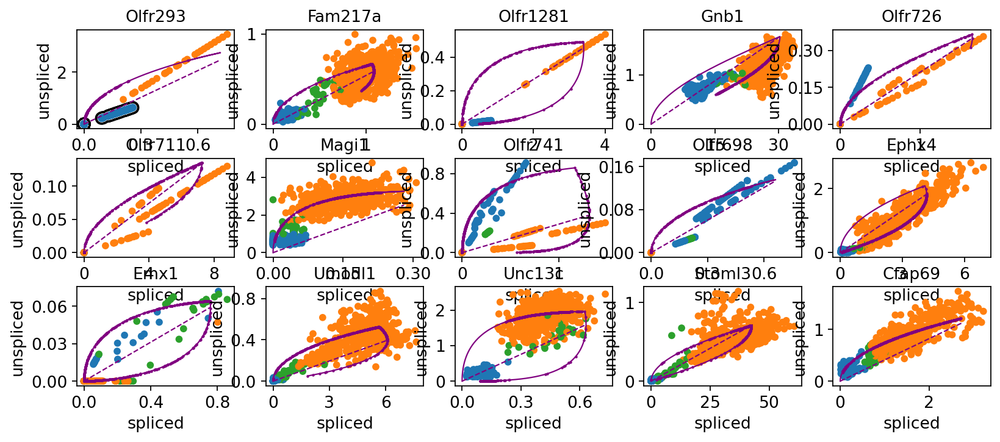

In [ ]:
scv.pl.scatter(f, basis=top_genes[15:30], ncols=5, add_outline='fit_diff_kinetics', save = 'differential-kinetics-15-30genes.pdf')

RECOMPUTING VELOCITIES

In [ ]:
scv.tl.velocity(f, diff_kinetics=True, groupby='celltype')
scv.tl.velocity_graph(f)

computing velocities
    finished (0:00:00) --> added 
    'velocity', velocity vectors for each individual cell (adata.layers)
computing velocity graph (using 1/20 cores)



    finished (0:00:00) --> added 
    'velocity_graph', sparse matrix with cosine correlations (adata.uns)


/home/sanjay/anaconda3/lib/python3.8/site-packages/scvelo/core/_parallelize.py:138: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray
  res = np.array(res) if as_array else res


computing velocity embedding
    finished (0:00:00) --> added
    'velocity_umap', embedded velocity vectors (adata.obsm)
saving figure to file ./figures/scvelo_differential-velocity.pdf


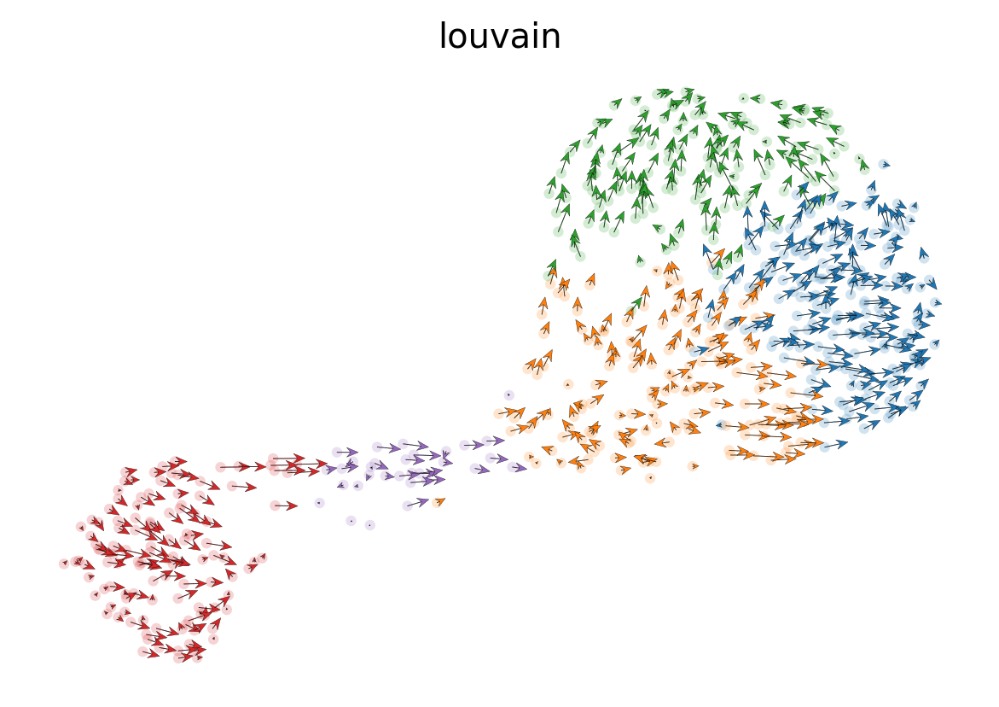

In [ ]:
scv.pl.velocity_embedding(f, dpi=120, arrow_size=2, arrow_length=2, save = 'differential-velocity.pdf')

DGE

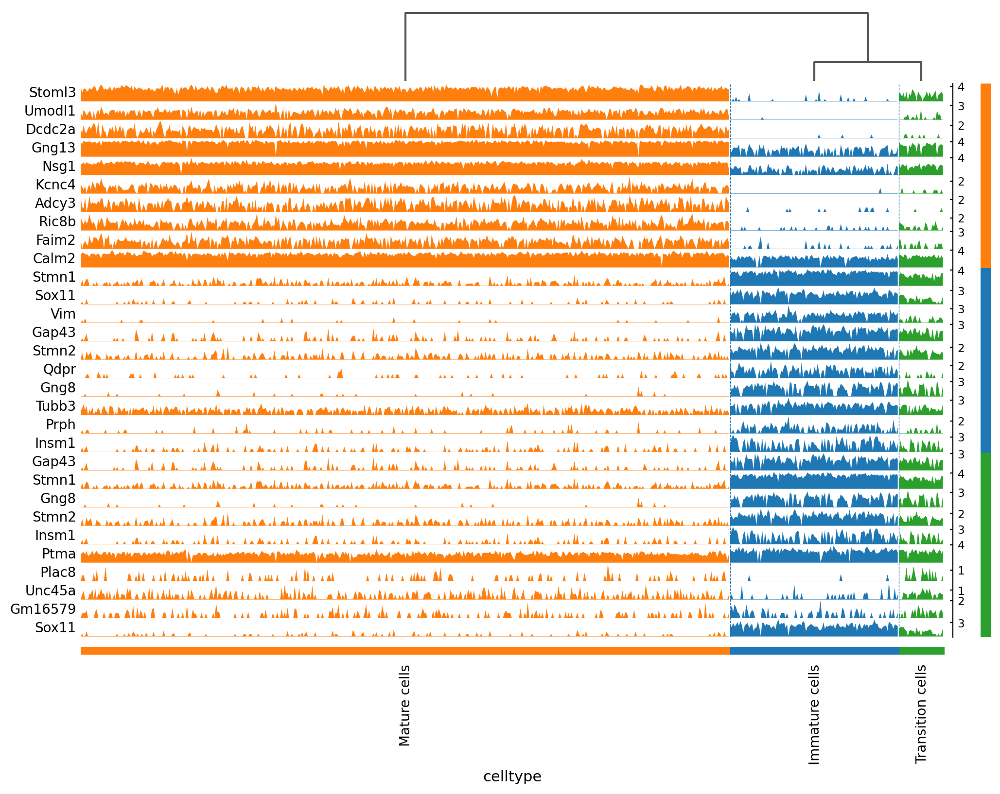

In [ ]:
scp.tl.rank_genes_groups(f, groupby='celltype', use_raw=True, 
                        method='t-test_overestim_var', n_genes=10) # compute differential expression
scp.pl.rank_genes_groups_tracksplot(f, groupby='celltype', save = 'differentialexp.pdf')

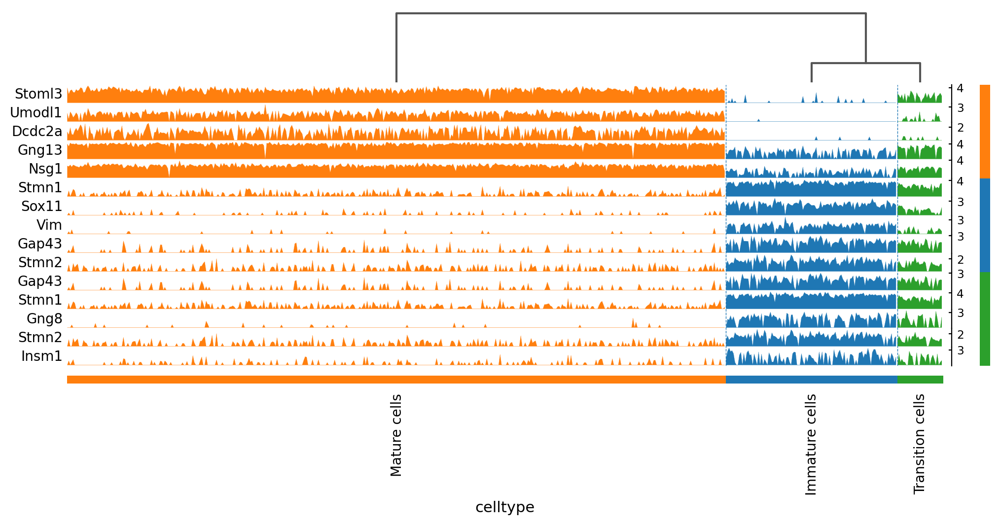

In [ ]:
scp.tl.rank_genes_groups(f, groupby='celltype', use_raw=True, 
                        method='t-test_overestim_var', n_genes=5) # compute differential expression
scp.pl.rank_genes_groups_tracksplot(f, groupby='celltype', save = 'diffexp5genes.pdf')

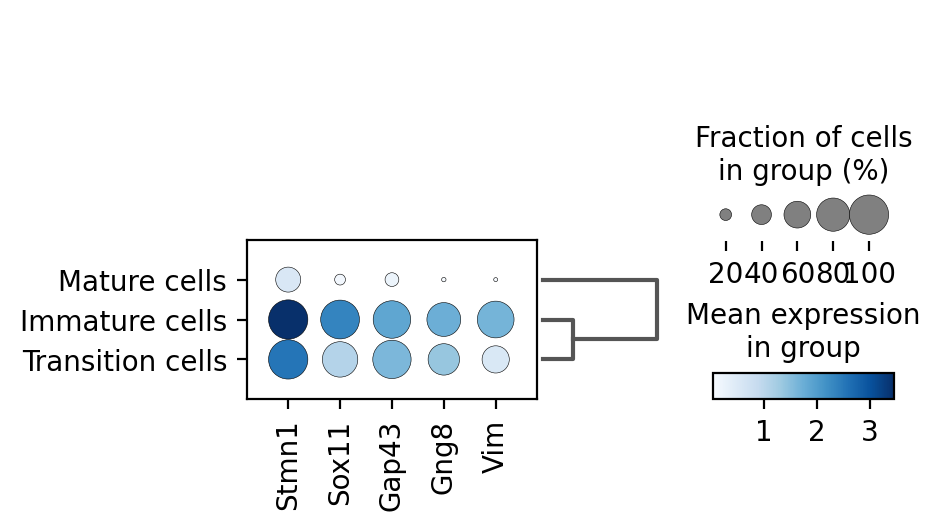

In [ ]:
im = ['Stmn1', 'Sox11', 'Gap43', 'Gng8', 'Vim']
scp.pl.dotplot(f, im,dendrogram=True, cmap='Blues', groupby='celltype', save = 'dotplot-immature-diffexp.pdf')

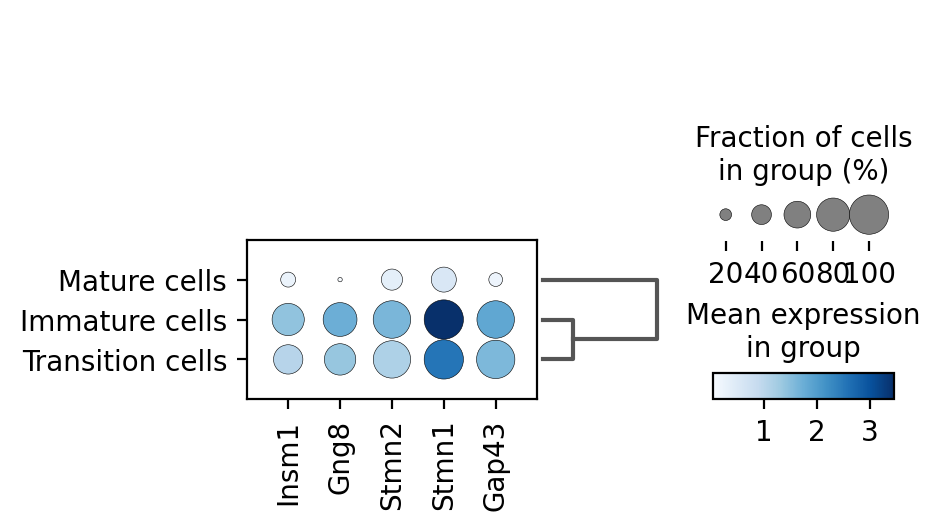

In [ ]:
tr = ['Insm1', 'Gng8', 'Stmn2', 'Stmn1', 'Gap43']
scp.pl.dotplot(f, tr,dendrogram=True, cmap='Blues', groupby='celltype', save = 'dotplot-trans-diffexp.pdf')

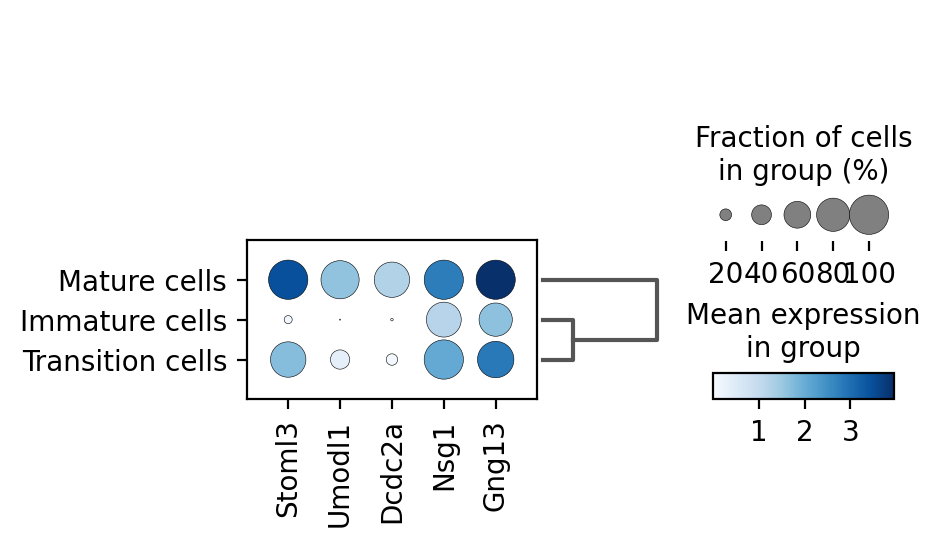

In [ ]:
m = ['Stoml3', 'Umodl1', 'Dcdc2a', 'Nsg1', 'Gng13']
scp.pl.dotplot(f, m,dendrogram=True, cmap='Blues', groupby='celltype', save = 'dotplot-mature-diffexp.pdf')

velocity length and confidence

In [ ]:
vl = f.obs['velocity_length']
vl.to_csv('velocity_length_wild.csv')

In [ ]:
vc = f.obs['velocity_confidence']
vc.to_csv('velocity_confi_wild.csv')